In [17]:
# Test cell for environment and dependency verification
import os
import sys
import platform

# Python and environment information
print(f"Python version: {platform.python_version()}")
print(f"Platform: {platform.platform()}")

# Check for CUDA
try:
    import torch
    print(f"PyTorch version: {torch.__version__}")
    print(f"CUDA available: {torch.cuda.is_available()}")
    if torch.cuda.is_available():
        print(f"CUDA version: {torch.version.cuda}")
        print(f"GPU device: {torch.cuda.get_device_name(0)}")
        print(f"Number of GPUs: {torch.cuda.device_count()}")
    else:
        print("CUDA is not available - training will use CPU")
except ImportError:
    print("PyTorch is not installed - you'll need to install it with pip install torch torchvision")

# Check for other required libraries
required_packages = ['numpy', 'matplotlib', 'pandas', 'opencv-python', 'ultralytics']

for package in required_packages:
    try:
        if package == 'opencv-python':
            import cv2
            print(f"✅ {package} is installed (version: {cv2.__version__})")
        else:
            module = __import__(package.replace('-', '_'))
            print(f"✅ {package} is installed (version: {module.__version__})")
    except ImportError:
        print(f"❌ {package} is NOT installed - use pip install {package}")
    except AttributeError:
        print(f"✅ {package} is installed (version unknown)")

# Manually set the project root path to ensure accuracy
project_root = "/home/peter/Desktop/TU PHD/WildlifeDetectionSystem"
print(f"\nProject root path: {project_root}")

# Output the current working directory for reference
print(f"Current working directory: {os.getcwd()}")

# Define expected data paths and include alternate paths
data_paths = {
    'raw_images': os.path.join(project_root, 'data', 'raw_images'),
    'export_yolo_alt': os.path.join(project_root, 'data', 'export', 'yolo_export'),
    'models': os.path.join(project_root, 'models', 'trained'),
    'notebooks': os.path.join(project_root, 'notebooks')
}

# Check if directories exist and list sample files if they do
for name, path in data_paths.items():
    if os.path.exists(path):
        print(f"✅ {name} directory exists: {path}")
        try:
            files = os.listdir(path)
            if files:
                print(f"   Sample files: {files[:3]}")
            else:
                print(f"   Directory is empty")
        except Exception as e:
            print(f"   Error listing directory: {e}")
    else:
        print(f"❌ {name} directory does not exist: {path}")

# Check if we need to create any directories
missing_dirs = [path for name, path in data_paths.items() if not os.path.exists(path) and 'alt' not in name]
if missing_dirs:
    print("\nWould you like to create the missing directories? (y/n)")
    # Uncomment the line below to auto-create directories if needed
    # for path in missing_dirs:
    #     os.makedirs(path, exist_ok=True)
    #     print(f"Created directory: {path}")

print("\nEnvironment setup check complete!")

Python version: 3.12.3
Platform: Linux-6.8.0-58-generic-x86_64-with-glibc2.39
PyTorch version: 2.6.0+cu124
CUDA available: True
CUDA version: 12.4
GPU device: NVIDIA GeForce RTX 4050 Laptop GPU
Number of GPUs: 1
✅ numpy is installed (version: 2.1.1)
✅ matplotlib is installed (version: 3.10.1)
✅ pandas is installed (version: 2.2.3)
✅ opencv-python is installed (version: 4.11.0)
✅ ultralytics is installed (version: 8.3.106)

Project root path: /home/peter/Desktop/TU PHD/WildlifeDetectionSystem
Current working directory: /home/peter/Desktop/TU PHD/WildlifeDetectionSystem/notebooks/training
✅ raw_images directory exists: /home/peter/Desktop/TU PHD/WildlifeDetectionSystem/data/raw_images
   Sample files: ['test_01']
❌ export_yolo_alt directory does not exist: /home/peter/Desktop/TU PHD/WildlifeDetectionSystem/data/export/yolo_export
✅ models directory exists: /home/peter/Desktop/TU PHD/WildlifeDetectionSystem/models/trained
   Sample files: ['wildlife_detector_improved', 'wildlife_detector3

YOLO Dataset Structure:
Classes file exists: True
Train images folder exists: True
Train labels folder exists: True
Val images folder exists: True
Val labels folder exists: True

Classes (30): ['Red Deer', 'Male Roe Deer', 'Female Roe Deer', 'Fallow Deer', 'Wild Boar', 'Chamois', 'Fox', 'Wolf', 'Jackal', 'Brown Bear', 'Badger', 'Weasel', 'Stoat', 'Polecat', 'Marten', 'Otter', 'Wildcat', 'Rabbit', 'Hare', 'Squirrel', 'Dormouse', 'Hedgehog', 'Turtle', 'Blackbird', 'Nightingale', 'Pheasant', 'Human', 'Background', 'Dog', 'woodpecker']

Training annotation files: 356
Validation annotation files: 89

Hierarchical Classification Groups:
  Deer: Red Deer, Male Roe Deer, Female Roe Deer, Fallow Deer
  Carnivores: Fox, Wolf, Jackal, Brown Bear, Badger, Weasel, Stoat, Polecat, Marten, Otter, Wildcat
  Small_Mammals: Rabbit, Hare, Squirrel, Dormouse, Hedgehog
  Birds: Blackbird, Nightingale, Pheasant, woodpecker
  Other: Wild Boar, Chamois, Turtle, Human, Background, Dog

Annotation distribution 

/tmp/ipykernel_13265/3254694085.py:154: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='Class', y='Total', data=top_classes, palette='viridis')


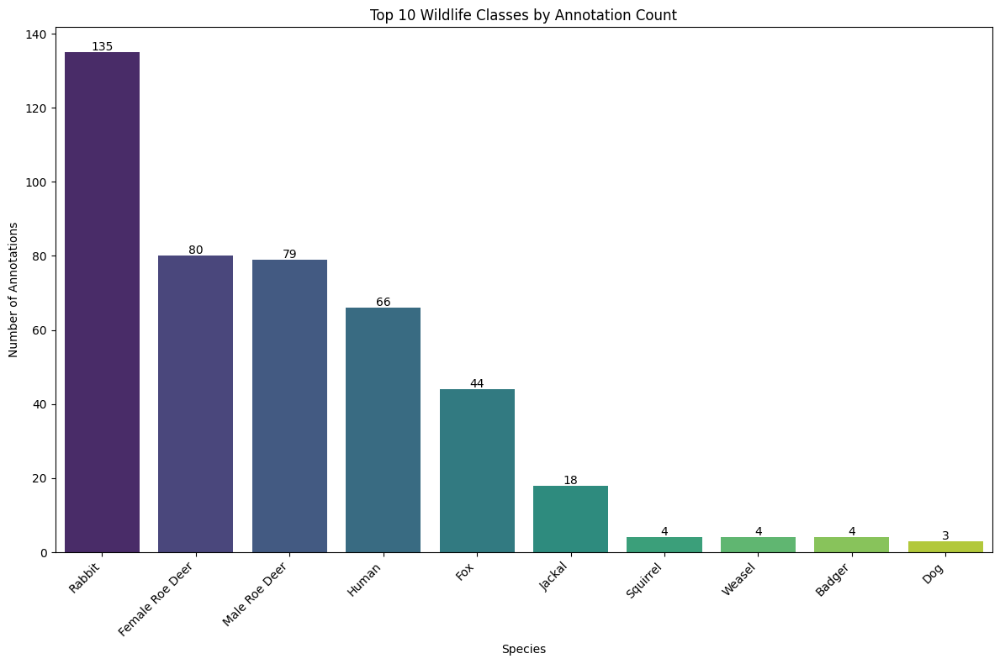

/tmp/ipykernel_13265/3254694085.py:170: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='Group', y='Total', data=group_df.sort_values('Total', ascending=False), palette='plasma')


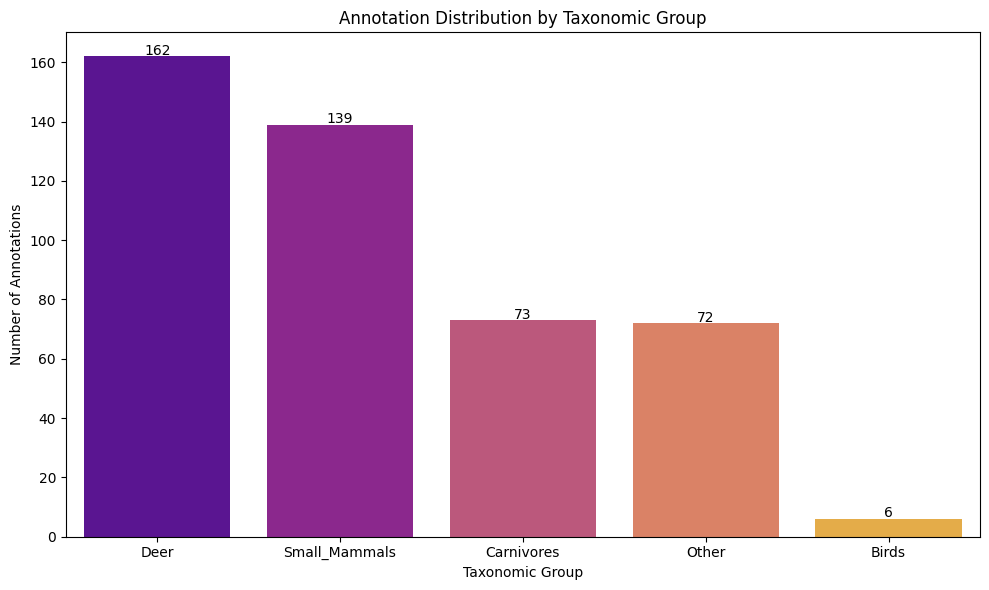

/tmp/ipykernel_13265/3254694085.py:221: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', len(class_names))



Displaying random training samples with annotations:


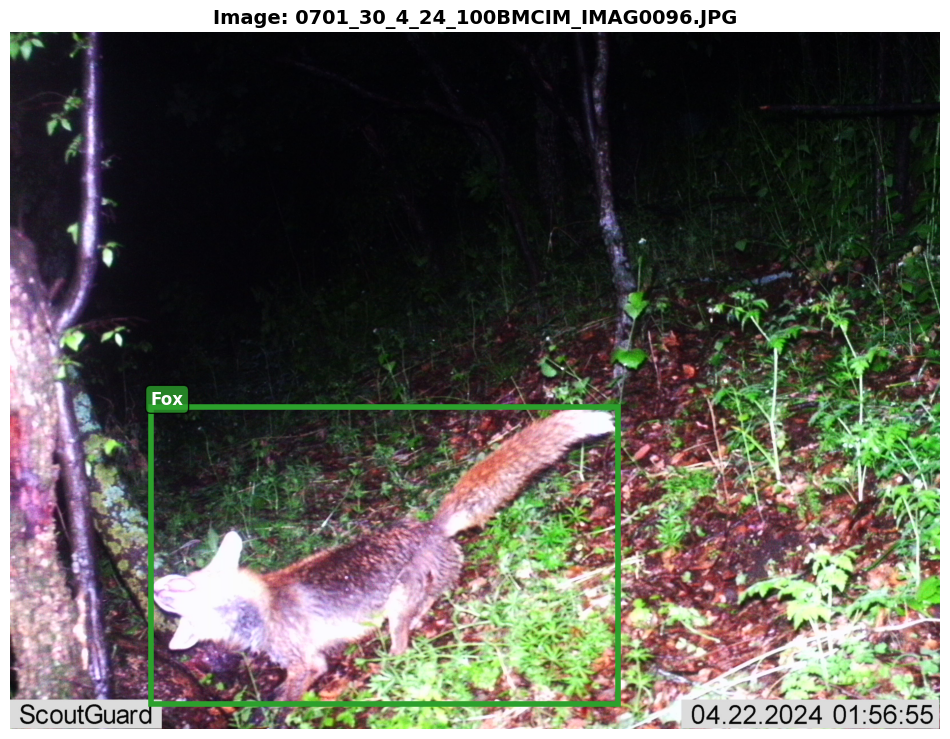

/tmp/ipykernel_13265/3254694085.py:221: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', len(class_names))


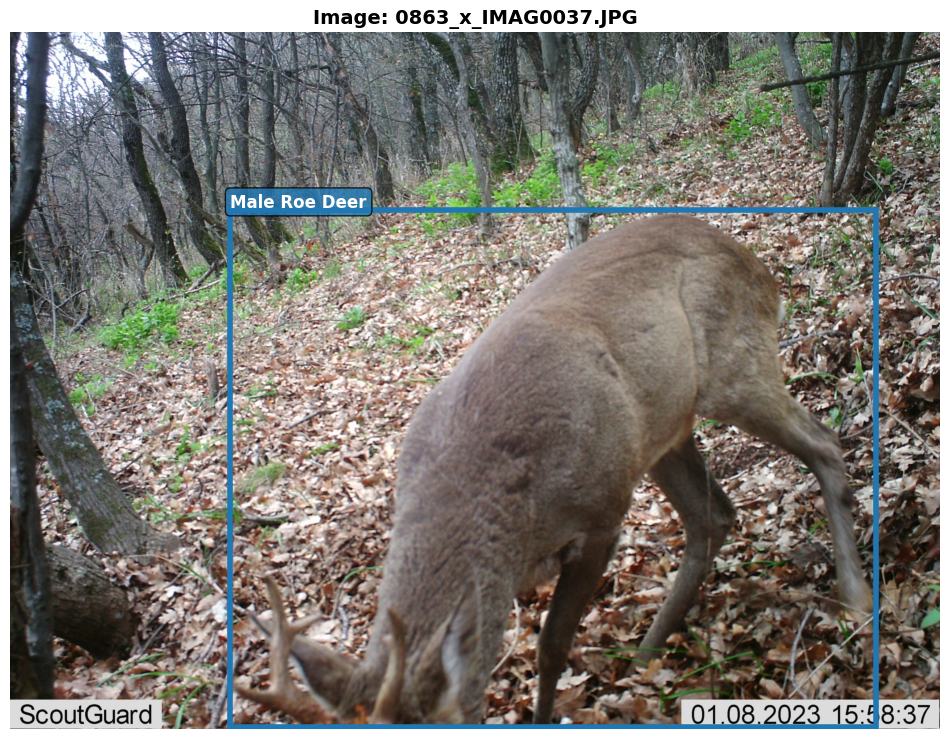

/tmp/ipykernel_13265/3254694085.py:221: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', len(class_names))


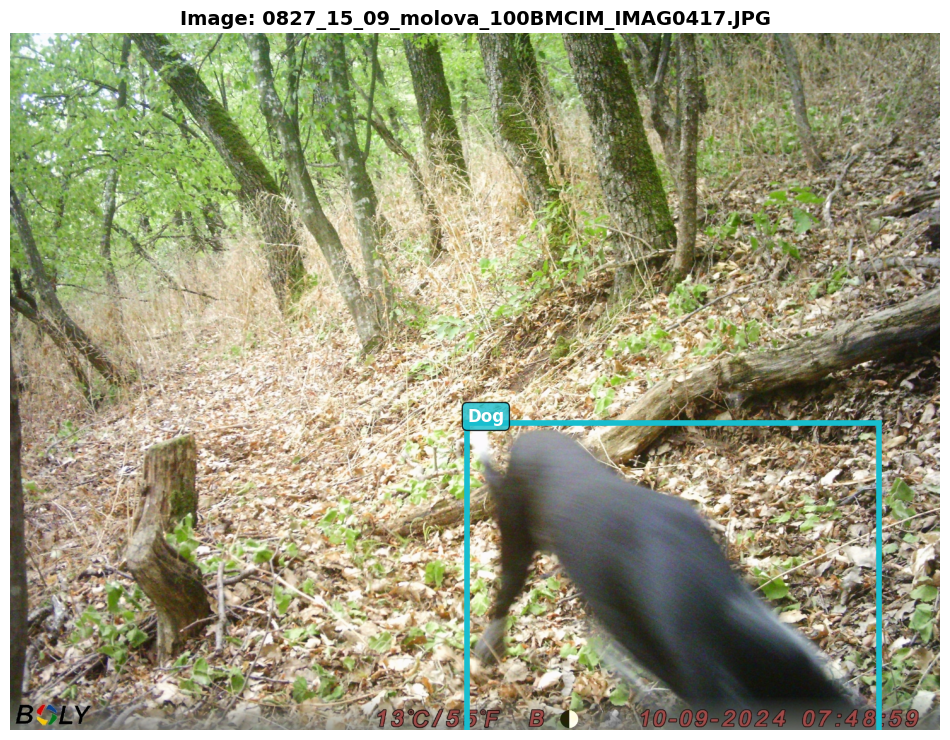

In [18]:
# Cell 2: Data Configuration and Exploration - REVISED for proper YOLO directory structure
import os
from ultralytics import YOLO
import matplotlib.pyplot as plt
import cv2
import numpy as np
import pandas as pd
import seaborn as sns
from PIL import Image

# Define dataset paths - UPDATED with correct path from latest export
data_dir = "/home/peter/Desktop/TU PHD/WildlifeDetectionSystem/data"
yolo_dataset_path = os.path.join(data_dir, "export/yolo_default_20250429_085945")
model_save_dir = "/home/peter/Desktop/TU PHD/WildlifeDetectionSystem/models/trained"
reports_dir = "/home/peter/Desktop/TU PHD/WildlifeDetectionSystem/reports"

# Check YOLO dataset structure
print("YOLO Dataset Structure:")
print(f"Classes file exists: {os.path.exists(os.path.join(yolo_dataset_path, 'classes.txt'))}")
print(f"Train images folder exists: {os.path.exists(os.path.join(yolo_dataset_path, 'images/train'))}")
print(f"Train labels folder exists: {os.path.exists(os.path.join(yolo_dataset_path, 'labels/train'))}")
print(f"Val images folder exists: {os.path.exists(os.path.join(yolo_dataset_path, 'images/val'))}")
print(f"Val labels folder exists: {os.path.exists(os.path.join(yolo_dataset_path, 'labels/val'))}")

# Read class names
with open(os.path.join(yolo_dataset_path, 'classes.txt'), 'r') as f:
    class_names = [line.strip() for line in f.readlines()]
print(f"\nClasses ({len(class_names)}): {class_names}")

# Count annotations per class in training set
train_labels_folder = os.path.join(yolo_dataset_path, 'labels/train')
val_labels_folder = os.path.join(yolo_dataset_path, 'labels/val')

train_label_files = os.listdir(train_labels_folder) if os.path.exists(train_labels_folder) else []
val_label_files = os.listdir(val_labels_folder) if os.path.exists(val_labels_folder) else []

print(f"\nTraining annotation files: {len(train_label_files)}")
print(f"Validation annotation files: {len(val_label_files)}")

# Define taxonomic groups for hierarchical classification
taxonomic_groups = {
    'Deer': [0, 1, 2, 3],  # Red Deer, Male Roe Deer, Female Roe Deer, Fallow Deer
    'Carnivores': [6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16],  # Fox, Wolf, Jackal, etc.
    'Small_Mammals': [17, 18, 19, 20, 21],  # Rabbit, Hare, Squirrel, etc.
    'Birds': [23, 24, 25, 29],  # Blackbird, Nightingale, Pheasant, woodpecker
    'Other': [4, 5, 22, 26, 27, 28]  # Wild Boar, Chamois, Turtle, Human, Background, Dog
}

# Print the hierarchical classification groups
print("\nHierarchical Classification Groups:")
for group_name, class_ids in taxonomic_groups.items():
    group_species = [class_names[idx] for idx in class_ids]
    print(f"  {group_name}: {', '.join(group_species)}")

# Count annotations per class
class_counts = {i: {'train': 0, 'val': 0} for i in range(len(class_names))}
total_annotations = {'train': 0, 'val': 0}

# Process training files
for label_file in train_label_files:
    label_path = os.path.join(train_labels_folder, label_file)
    try:
        with open(label_path, 'r') as f:
            for line in f.readlines():
                parts = line.strip().split()
                if len(parts) >= 5:  # Valid label format
                    class_id = int(parts[0])
                    if class_id < len(class_names):
                        class_counts[class_id]['train'] += 1
                        total_annotations['train'] += 1
    except Exception as e:
        print(f"Error reading {label_file}: {e}")

# Process validation files
for label_file in val_label_files:
    label_path = os.path.join(val_labels_folder, label_file)
    try:
        with open(label_path, 'r') as f:
            for line in f.readlines():
                parts = line.strip().split()
                if len(parts) >= 5:  # Valid label format
                    class_id = int(parts[0])
                    if class_id < len(class_names):
                        class_counts[class_id]['val'] += 1
                        total_annotations['val'] += 1
    except Exception as e:
        print(f"Error reading {label_file}: {e}")

# Calculate taxonomic group counts
group_counts = {group: {'train': 0, 'val': 0} for group in taxonomic_groups}
for group_name, class_ids in taxonomic_groups.items():
    for class_id in class_ids:
        if class_id < len(class_names):
            group_counts[group_name]['train'] += class_counts[class_id]['train']
            group_counts[group_name]['val'] += class_counts[class_id]['val']

# Display class distribution
print("\nAnnotation distribution by class:")
class_data = []
for class_id in range(len(class_names)):
    train_count = class_counts[class_id]['train']
    val_count = class_counts[class_id]['val']
    total_count = train_count + val_count
    
    if total_count > 0:
        train_percent = (train_count / total_count) * 100 if total_count > 0 else 0
        val_percent = (val_count / total_count) * 100 if total_count > 0 else 0
        
        print(f"  {class_names[class_id]}: Train={train_count}, Val={val_count}, Total={total_count} ({train_percent:.1f}% / {val_percent:.1f}%)")
        
        class_data.append({
            'Class': class_names[class_id],
            'Train': train_count,
            'Val': val_count,
            'Total': total_count
        })

# Display taxonomic group distribution
print("\nAnnotation distribution by taxonomic group:")
group_data = []
for group_name, counts in group_counts.items():
    train_count = counts['train']
    val_count = counts['val']
    total_count = train_count + val_count
    
    if total_count > 0:
        train_percent = (train_count / total_count) * 100 if total_count > 0 else 0
        val_percent = (val_count / total_count) * 100 if total_count > 0 else 0
        
        print(f"  {group_name}: Train={train_count}, Val={val_count}, Total={total_count} ({train_percent:.1f}% / {val_percent:.1f}%)")
        
        group_data.append({
            'Group': group_name,
            'Train': train_count,
            'Val': val_count,
            'Total': total_count
        })

# Create DataFrames for visualization
class_df = pd.DataFrame(class_data)
group_df = pd.DataFrame(group_data)

# Get paths to training and validation images folders
train_images_folder = os.path.join(yolo_dataset_path, 'images/train')
val_images_folder = os.path.join(yolo_dataset_path, 'images/val')

# Get list of image files
train_image_files = os.listdir(train_images_folder) if os.path.exists(train_images_folder) else []
val_image_files = os.listdir(val_images_folder) if os.path.exists(val_images_folder) else []

# Visualization of class distribution (top 10 classes for readability)
plt.figure(figsize=(12, 8))
top_classes = class_df.sort_values('Total', ascending=False).head(10)
ax = sns.barplot(x='Class', y='Total', data=top_classes, palette='viridis')
plt.title('Top 10 Wildlife Classes by Annotation Count')
plt.xlabel('Species')
plt.ylabel('Number of Annotations')
plt.xticks(rotation=45, ha='right')

# Add value labels on top of bars
for i, v in enumerate(top_classes['Total']):
    ax.text(i, v + 0.5, str(v), ha='center')

plt.tight_layout()
plt.savefig(os.path.join(reports_dir, "top_classes_distribution.png"))
plt.show()

# Visualization of taxonomic group distribution
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='Group', y='Total', data=group_df.sort_values('Total', ascending=False), palette='plasma')
plt.title('Annotation Distribution by Taxonomic Group')
plt.xlabel('Taxonomic Group')
plt.ylabel('Number of Annotations')

# Add value labels on top of bars
for i, v in enumerate(group_df.sort_values('Total', ascending=False)['Total']):
    ax.text(i, v + 0.5, str(v), ha='center')

plt.tight_layout()
plt.savefig(os.path.join(reports_dir, "taxonomic_group_distribution.png"))
plt.show()

# Visualize a few samples with annotations - IMPROVED for better visibility
def display_sample_with_annotations(image_path, label_path, class_names):
    # Read image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Could not read image: {image_path}")
        return
        
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    height, width, _ = image.shape
    
    # Read annotations
    boxes = []
    classes = []
    try:
        with open(label_path, 'r') as f:
            for line in f.readlines():
                parts = line.strip().split()
                if len(parts) >= 5:
                    class_id = int(parts[0])
                    x_center, y_center, w, h = map(float, parts[1:5])
                    
                    # Convert from normalized YOLO format to pixel coordinates
                    x1 = int((x_center - w/2) * width)
                    y1 = int((y_center - h/2) * height)
                    x2 = int((x_center + w/2) * width)
                    y2 = int((y_center + h/2) * height)
                    
                    boxes.append((x1, y1, x2, y2))
                    classes.append(class_id)
    except Exception as e:
        print(f"Error reading labels: {e}")
    
    # Plot image with enhanced boxes
    plt.figure(figsize=(12, 10))
    plt.imshow(image)
    
    # Create a vibrant color palette for different classes
    cmap = plt.cm.get_cmap('tab10', len(class_names))
    
    for (x1, y1, x2, y2), class_id in zip(boxes, classes):
        # Get color from colormap
        if class_id < len(class_names):
            class_name = class_names[class_id]
            color = cmap(class_id % cmap.N)
        else:
            class_name = f"Unknown {class_id}"
            color = cmap(0)
        
        # Draw thicker, more visible rectangle
        rect = plt.Rectangle((x1, y1), x2-x1, y2-y1, 
                           fill=False, edgecolor=color, linewidth=4)
        plt.gca().add_patch(rect)
        
        # Add more visible label with background
        plt.text(x1, y1-10, class_name, 
                bbox=dict(facecolor=color, alpha=0.8, boxstyle="round,pad=0.3"), 
                fontsize=12, color='white', fontweight='bold')
    
    plt.axis('off')
    plt.title(f"Image: {os.path.basename(image_path)}", fontsize=14, fontweight='bold')
    
    # Save the visualization with high quality
    output_file = os.path.join(reports_dir, f"sample_{os.path.basename(image_path)}")
    plt.savefig(output_file, dpi=200, bbox_inches='tight')
    plt.show()

# Display 3 random samples with annotations from training set
import random
if os.path.exists(train_images_folder) and len(os.listdir(train_images_folder)) > 0:
    image_files = os.listdir(train_images_folder)
    sample_image_files = random.sample(image_files, min(3, len(image_files)))
    
    print("\nDisplaying random training samples with annotations:")
    for image_file in sample_image_files:
        image_path = os.path.join(train_images_folder, image_file)
        base_name = os.path.splitext(image_file)[0]
        label_file = f"{base_name}.txt"
        label_path = os.path.join(train_labels_folder, label_file)
        
        if os.path.exists(label_path):
            display_sample_with_annotations(image_path, label_path, class_names)
        else:
            print(f"No label file found for {image_file}")
else:
    print("No training images found to display")

Checking if YAML config exists: True

Data YAML Configuration:
train: images/train
val: images/val
nc: 30
names:
- Red Deer
- Male Roe Deer
- Female Roe Deer
- Fallow Deer
- Wild Boar
- Chamois
- Fox
- Wolf
- Jackal
- Brown Bear
- Badger
- Weasel
- Stoat
- Polecat
- Marten
- Otter
- Wildcat
- Rabbit
- Hare
- Squirrel
- Dormouse
- Hedgehog
- Turtle
- Blackbird
- Nightingale
- Pheasant
- Human
- Background
- Dog
- woodpecker


Initializing YOLOv8M model...

Model Architecture:
Model type: YOLOv8M
Pretrained on: COCO dataset (80 classes)
Parameters: 25.9 million parameters
Number of classes to train for: 30

Calculating class weights to address class imbalance...

Class weights for training (most imbalanced classes):
  Red Deer: 3.26
  Nightingale: 3.26
  Fallow Deer: 1.63
  woodpecker: 1.63
  Wildcat: 1.09


/tmp/ipykernel_13265/328058677.py:124: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='Class', y='Weight', data=weight_df.head(10), palette='plasma')


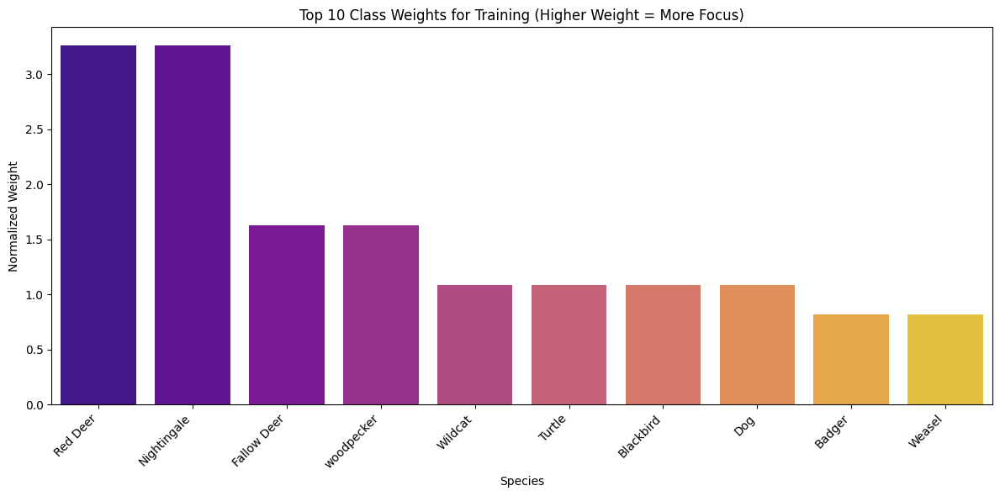


Training Configuration:
- Image size: 640
- Batch size: 16
- Maximum epochs: 100
- Early stopping patience: 25
- Warmup epochs: 5
- Dataset path: /home/peter/Desktop/TU PHD/WildlifeDetectionSystem/data/export/yolo_default_20250429_085945/data.yaml
- Model save directory: /home/peter/Desktop/TU PHD/WildlifeDetectionSystem/models/trained

Analyzing taxonomic groups for hierarchical training approach:
  ✅ Deer: 162 annotations - viable for Stage 1 training
  ✅ Carnivores: 73 annotations - viable for Stage 1 training
  ✅ Small_Mammals: 139 annotations - viable for Stage 1 training
  ❌ Birds: 6 annotations - insufficient data
  ✅ Other: 72 annotations - viable for Stage 1 training

Hierarchical Training Plan:
Stage 1: Parent Category Model
  - Group species into broader taxonomic categories
  - Train on all data with parent categories
  - Focus on high detection accuracy regardless of specific species

Stage 2: Fine-tuning for Specific Species
  - Use Stage 1 weights as starting point
  - 

In [19]:
# Cell 3: YOLOv8 Model Configuration and Dataset Setup
import os
import yaml
import pandas as pd
import seaborn as sns

# Validate and update data.yaml if necessary
yaml_path = os.path.join(yolo_dataset_path, 'data.yaml')
print(f"Checking if YAML config exists: {os.path.exists(yaml_path)}")

# Create a comprehensive data.yaml file if it doesn't exist or needs modification
if os.path.exists(yaml_path):
    # Read existing YAML file and make sure it's properly formatted
    with open(yaml_path, 'r') as f:
        yaml_data = yaml.safe_load(f)
    
    # Check for required keys and update if needed
    yaml_updated = False
    
    # Make sure paths are relative for better portability
    if 'train' in yaml_data and not yaml_data['train'].startswith('images/'):
        yaml_data['train'] = os.path.join('images', 'train')
        yaml_updated = True
    
    if 'val' in yaml_data and not yaml_data['val'].startswith('images/'):
        yaml_data['val'] = os.path.join('images', 'val')
        yaml_updated = True
    
    # Update YAML if changes were made
    if yaml_updated:
        print("Updating data.yaml to ensure it's correctly formatted...")
        with open(yaml_path, 'w') as f:
            yaml.dump(yaml_data, f, sort_keys=False)
        print("Updated data.yaml")
else:
    print("Creating data.yaml file...")
    
    # Create YAML content
    yaml_content = {
        'path': yolo_dataset_path,                   # dataset root dir
        'train': os.path.join('images', 'train'),    # train images relative to 'path'
        'val': os.path.join('images', 'val'),        # val images relative to 'path'
        'nc': len(class_names),                      # number of classes
        'names': class_names                         # class names
    }
    
    # Write YAML file
    with open(yaml_path, 'w') as f:
        yaml.dump(yaml_content, f, sort_keys=False)
    
    print(f"Created data.yaml with {len(class_names)} classes")

# Print YAML file content for verification
with open(yaml_path, 'r') as f:
    yaml_content = f.read()
    print("\nData YAML Configuration:")
    print(yaml_content)

# Define sizes for reference
model_size_mapping = {
    'n': '3.2',
    's': '11.2',
    'm': '25.9',
    'l': '43.7',
    'x': '68.2'
}

# Initialize YOLOv8 model - choose model size based on dataset size and complexity
# - Nano (n): 3.2M parameters, faster but less accurate
# - Small (s): 11.2M parameters, balanced option
# - Medium (m): 25.9M parameters, more accurate but slower
# - Large (l): 43.7M parameters, highest accuracy but slowest
model_size = 'm'  # medium model for better accuracy with wildlife
pretrained_model = f'yolov8{model_size}.pt' 

print(f"\nInitializing YOLOv8{model_size.upper()} model...")
model = YOLO(pretrained_model)

print("\nModel Architecture:")
print(f"Model type: YOLOv8{model_size.upper()}")
print(f"Pretrained on: COCO dataset (80 classes)")
print(f"Parameters: {model_size_mapping[model_size]} million parameters")
print(f"Number of classes to train for: {len(class_names)}")

# Calculate class weights for addressing class imbalance
print("\nCalculating class weights to address class imbalance...")
class_weights = {}
non_zero_classes = {}

for class_id in range(len(class_names)):
    train_count = class_counts[class_id]['train']
    val_count = class_counts[class_id]['val']
    total_count = train_count + val_count
    
    if total_count > 0:
        non_zero_classes[class_id] = total_count

if non_zero_classes:
    max_count = max(non_zero_classes.values())
    
    for class_id, count in non_zero_classes.items():
        # Higher weight for less frequent classes (inverse frequency)
        class_weights[class_id] = max_count / count
    
    # Normalize weights to be more stable
    weight_sum = sum(class_weights.values())
    normalized_weights = {k: v/weight_sum*len(class_weights) for k, v in class_weights.items()}
    
    # Display weights for the most imbalanced classes
    print("\nClass weights for training (most imbalanced classes):")
    sorted_weights = {k: v for k, v in sorted(normalized_weights.items(), key=lambda item: item[1], reverse=True)}
    
    for class_id, weight in list(sorted_weights.items())[:5]:
        class_name = class_names[class_id] if class_id < len(class_names) else f"Unknown {class_id}"
        print(f"  {class_name}: {weight:.2f}")
    
    # Visualize class weights
    weight_df = pd.DataFrame({
        'Class': [class_names[i] if i < len(class_names) else f"Unknown {i}" for i in sorted_weights.keys()],
        'Weight': list(sorted_weights.values())
    })
    
    plt.figure(figsize=(12, 6))
    ax = sns.barplot(x='Class', y='Weight', data=weight_df.head(10), palette='plasma')
    plt.title('Top 10 Class Weights for Training (Higher Weight = More Focus)')
    plt.xlabel('Species')
    plt.ylabel('Normalized Weight')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.savefig(os.path.join(reports_dir, "class_weights.png"))
    plt.show()

# Setup key hyperparameters for wildlife detection
IMAGE_SIZE = 640      # YOLOv8 standard input size
BATCH_SIZE = 16       # Smaller batches for better generalization
EPOCHS = 100          # Maximum training epochs
PATIENCE = 25         # Early stopping patience
WARMUP_EPOCHS = 5     # Longer warmup for stability with imbalanced classes

print("\nTraining Configuration:")
print(f"- Image size: {IMAGE_SIZE}")
print(f"- Batch size: {BATCH_SIZE}")
print(f"- Maximum epochs: {EPOCHS}")
print(f"- Early stopping patience: {PATIENCE}")
print(f"- Warmup epochs: {WARMUP_EPOCHS}")
print(f"- Dataset path: {yaml_path}")
print(f"- Model save directory: {model_save_dir}")

# Determine which taxonomic groups have enough data for the hierarchical approach
print("\nAnalyzing taxonomic groups for hierarchical training approach:")
viable_groups = []
for group_name, counts in group_counts.items():
    train_count = counts['train']
    val_count = counts['val']
    total_count = train_count + val_count
    
    # Consider a group viable if it has at least 20 annotations
    if total_count >= 20:
        viable_groups.append(group_name)
        print(f"  ✅ {group_name}: {total_count} annotations - viable for Stage 1 training")
    else:
        print(f"  ❌ {group_name}: {total_count} annotations - insufficient data")

# Define hierarchical training plan
print("\nHierarchical Training Plan:")
print("Stage 1: Parent Category Model")
print("  - Group species into broader taxonomic categories")
print("  - Train on all data with parent categories")
print("  - Focus on high detection accuracy regardless of specific species")

print("\nStage 2: Fine-tuning for Specific Species")
print("  - Use Stage 1 weights as starting point")
print("  - Fine-tune on species with sufficient examples:")
viable_species = []
for class_id in range(len(class_names)):
    total_count = class_counts[class_id]['train'] + class_counts[class_id]['val']
    if total_count >= 10:  # Consider species viable if it has at least 10 annotations
        viable_species.append((class_names[class_id], total_count))

for species, count in sorted(viable_species, key=lambda x: x[1], reverse=True):
    print(f"    ✅ {species}: {count} annotations")

print("\nStage 3: Specialized Models (if needed)")
print("  - Train specialized models for particular taxonomic groups")
print("  - Implement ensemble methods for improved accuracy")

In [20]:
# Cell 4: Model Training with Optimized Parameters for Wildlife Detection
import time
from datetime import datetime

# Fix definition of model_size_mapping before using it
model_size_mapping = {
    'n': '3.2',
    's': '11.2',
    'm': '25.9',
    'l': '43.7',
    'x': '68.2'
}

# Create a timestamped model name
timestamp = datetime.now().strftime("%Y%m%d_%H%M")
model_name = f"wildlife_detector_{timestamp}"
model_save_path = os.path.join(model_save_dir, model_name)

# Create directories if needed
os.makedirs(model_save_dir, exist_ok=True)
os.makedirs(reports_dir, exist_ok=True)

# Set optimized training parameters for wildlife detection
print("Configuring training parameters optimized for wildlife detection...")

# Hyperparameters specifically tuned for small, imbalanced wildlife datasets
hyperparameters = {
    'epochs': EPOCHS,
    'patience': PATIENCE,
    'batch': BATCH_SIZE,
    'imgsz': IMAGE_SIZE,
    'data': yaml_path,
    'project': model_save_dir,
    'name': model_name,
    
    # Optimization parameters
    'optimizer': 'AdamW',    # AdamW works better for imbalanced datasets
    'lr0': 0.001,            # Initial learning rate
    'lrf': 0.01,             # Learning rate final factor
    'momentum': 0.937,       # SGD momentum/Adam beta1
    'weight_decay': 0.0005,  # Regularization to prevent overfitting
    'warmup_epochs': WARMUP_EPOCHS,  # Longer warmup period for stability
    'warmup_momentum': 0.8,  # Initial warmup momentum
    'warmup_bias_lr': 0.1,   # Initial warmup learning rate for bias
    
    # Loss function weights - crucial for imbalanced datasets
    'box': 7.5,              # Box loss gain for better localization
    'cls': 3.0,              # Class loss gain increased for better classification 
    'dfl': 1.5,              # Distribution focal loss gain
    
    # Data augmentation parameters - heavy augmentation for small datasets
    'hsv_h': 0.015,          # HSV Hue augmentation
    'hsv_s': 0.7,            # HSV Saturation augmentation (higher for wildlife)
    'hsv_v': 0.4,            # HSV Value augmentation (stronger for varying lighting)
    'degrees': 10.0,         # Rotation augmentation
    'translate': 0.2,        # Translation augmentation
    'scale': 0.6,            # Scale augmentation (stronger for wildlife detection)
    'fliplr': 0.5,           # Horizontal flip probability
    'mosaic': 1.0,           # Mosaic augmentation (keep at max)
    'mixup': 0.1,            # Mixup augmentation (moderate)
    'copy_paste': 0.1,       # Copy-paste augmentation (useful for rare classes)
    
    # Other settings
    'device': 0,             # Use GPU device 0
    'workers': 8,            # DataLoader workers
    'cache': True,           # Cache images for faster training
    'save': True,            # Save checkpoints
    'save_period': 10,       # Save checkpoints every 10 epochs
}

# Display the most important hyperparameters
print("\nKey Training Parameters:")
important_params = ['epochs', 'batch', 'imgsz', 'optimizer', 'lr0', 
                   'patience', 'box', 'cls', 'scale', 'mosaic', 'mixup']
for param in important_params:
    if param in hyperparameters:
        print(f"- {param}: {hyperparameters[param]}")

# Notes on wildlife-specific considerations
print("\nWildlife-Specific Training Considerations:")
print("- Heavy augmentation to handle limited data")
print("- Increased focus on box accuracy (box loss weight: 7.5)")
print("- Enhanced class loss weight (3.0) to improve species classification")
print("- Copy-paste augmentation to help with rare species")
print("- HSV augmentation to handle different lighting conditions in camera traps")

# Display training workflow for hierarchical approach
print("\nTraining Workflow - Stage 1 (Taxonomic Groups):")
print("1. Train parent category model on broader taxonomic groups")
print("2. Evaluate performance on validation set")
print("3. Save model weights for Stage 2 fine-tuning")

# IMPORTANT: The following code is commented out as it's a preparation for training
# To execute the actual training, uncomment these sections when ready
"""
# Start training timer
print(f"\nStarting YOLOv8 training on {len(train_image_files)} images...")
start_time = time.time()

# Train the model with selected hyperparameters
results = model.train(**hyperparameters)

# Calculate training time
training_time = time.time() - start_time
hours, remainder = divmod(training_time, 3600)
minutes, seconds = divmod(remainder, 60)

print(f"\nTraining completed in {int(hours)}h {int(minutes)}m {int(seconds)}s")

# Summary of training results
print("\nTraining Results:")
print(f"Best mAP50-95: {results.maps[0]:.4f}")
print(f"Best mAP50: {results.maps[1]:.4f}")

# Save training summary to reports directory
summary_path = os.path.join(reports_dir, f"training_summary_{timestamp}.md")
with open(summary_path, 'w') as f:
    f.write(f"# Wildlife Detection Model Training Summary\n\n")
    f.write(f"## Training Metadata\n")
    f.write(f"- **Date and Time**: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n")
    f.write(f"- **Model**: YOLOv8{model_size.upper()}\n")
    f.write(f"- **Training Duration**: {int(hours)}h {int(minutes)}m {int(seconds)}s\n")
    f.write(f"- **Training Dataset**: {len(train_image_files)} images\n")
    f.write(f"- **Validation Dataset**: {len(val_image_files)} images\n")
    f.write(f"- **Epochs**: {EPOCHS}\n\n")
    
    f.write(f"## Performance Metrics\n")
    f.write(f"- **Best mAP50-95**: {results.maps[0]:.4f}\n")
    f.write(f"- **Best mAP50**: {results.maps[1]:.4f}\n\n")
    
    f.write(f"## Key Training Parameters\n")
    for param, value in hyperparameters.items():
        if param in important_params:
            f.write(f"- **{param}**: {value}\n")
    
    f.write(f"\n## Class Distribution\n")
    for class_id, count in sorted(non_zero_classes.items(), key=lambda x: x[1], reverse=True):
        if count > 0:
            class_name = class_names[class_id] if class_id < len(class_names) else f"Unknown {class_id}"
            total_count = class_counts[class_id]['train'] + class_counts[class_id]['val']
            percentage = (total_count / sum(non_zero_classes.values())) * 100
            f.write(f"- **{class_name}**: {total_count} ({percentage:.1f}%)\n")

print(f"Training summary saved to: {summary_path}")
"""

# Custom function to train hierarchical models
def train_hierarchical_model(parent_categories, stage="Stage1_Parent"):
    """
    Train a hierarchical model based on parent categories
    
    Args:
        parent_categories: Dictionary mapping parent categories to lists of class IDs
        stage: Name of the training stage
    
    Returns:
        Path to the trained model
    """
    print(f"\nPreparing to train hierarchical model: {stage}")
    
    # Create a mapping from original class IDs to parent category IDs
    class_to_parent = {}
    parent_names = list(parent_categories.keys())
    
    for parent_id, (parent_name, class_ids) in enumerate(parent_categories.items()):
        for class_id in class_ids:
            class_to_parent[class_id] = parent_id
    
    # Create a new YAML file for the parent categories
    hier_yaml_path = os.path.join(yolo_dataset_path, f'data_hierarchical_{stage}.yaml')
    
    # Copy the original YAML but update names
    with open(yaml_path, 'r') as f:
        yaml_data = yaml.safe_load(f)
    
    # Update with parent category names
    yaml_data['names'] = parent_names
    yaml_data['nc'] = len(parent_names)
    
    with open(hier_yaml_path, 'w') as f:
        yaml.dump(yaml_data, f, sort_keys=False)
    
    print(f"Created hierarchical YAML config with {len(parent_names)} parent categories")
    
    # We need to map the training and validation labels to parent categories
    # This would require modifying the label files, which we'll outline but not execute:
    
    print("\nTo run hierarchical training, you would need to:")
    print("1. Create copies of the label files with mapped class IDs")
    print("2. Train using these mapped labels")
    print("3. Save the model for fine-tuning in Stage 2")
    
    # Return a placeholder for the model path
    return os.path.join(model_save_dir, f"wildlife_detector_{stage}_{timestamp}")

# Outline the full hierarchical training process
print("\nTo execute the full hierarchical training process:")
print("1. Run the Stage 1 parent category training")
print("2. Evaluate the Stage 1 model")
print("3. Use Stage 1 weights to initialize Stage 2 fine-tuning")
print("4. Train specialized models if needed for Stage 3")

Configuring training parameters optimized for wildlife detection...

Key Training Parameters:
- epochs: 100
- batch: 16
- imgsz: 640
- optimizer: AdamW
- lr0: 0.001
- patience: 25
- box: 7.5
- cls: 3.0
- scale: 0.6
- mosaic: 1.0
- mixup: 0.1

Wildlife-Specific Training Considerations:
- Heavy augmentation to handle limited data
- Increased focus on box accuracy (box loss weight: 7.5)
- Enhanced class loss weight (3.0) to improve species classification
- Copy-paste augmentation to help with rare species
- HSV augmentation to handle different lighting conditions in camera traps

Training Workflow - Stage 1 (Taxonomic Groups):
1. Train parent category model on broader taxonomic groups
2. Evaluate performance on validation set
3. Save model weights for Stage 2 fine-tuning

To execute the full hierarchical training process:
1. Run the Stage 1 parent category training
2. Evaluate the Stage 1 model
3. Use Stage 1 weights to initialize Stage 2 fine-tuning
4. Train specialized models if needed 

In [21]:
# Cell 5: Model Evaluation and Performance Analysis
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
import cv2
from datetime import datetime

# This cell provides the code for evaluating model performance
# It should be run after the training is complete

# Function to evaluate model performance on the validation set
def evaluate_model(model_path, data_yaml, conf_threshold=0.25):
    """
    Evaluate a trained YOLOv8 model on the validation set
    
    Args:
        model_path: Path to the trained model weights
        data_yaml: Path to the data.yaml configuration file
        conf_threshold: Confidence threshold for detection
        
    Returns:
        Evaluation metrics and results
    """
    print(f"Evaluating model: {model_path}")
    print(f"Using data config: {data_yaml}")
    print(f"Confidence threshold: {conf_threshold}")
    
    # Load the model
    try:
        model = YOLO(model_path)
        print("Model loaded successfully")
    except Exception as e:
        print(f"Error loading model: {e}")
        return None
    
    # Define validation parameters
    val_params = {
        'data': data_yaml,
        'batch': 8,
        'imgsz': IMAGE_SIZE,
        'conf': conf_threshold,
        'iou': 0.7,  # Higher IoU threshold for better quality detections
        'device': 0, # Use GPU
        'verbose': True,
        'save_json': False,
        'save_hybrid': True,
        'task': 'val',
    }
    
    # Run validation
    print("Running validation...")
    results = model.val(**val_params)
    
    # Print evaluation results
    print("\nOverall Performance Metrics:")
    print(f"- mAP50-95: {results.box.map:.4f}")
    print(f"- mAP50: {results.box.map50:.4f}")
    print(f"- Precision: {results.box.mp:.4f}")
    print(f"- Recall: {results.box.mr:.4f}")
    
    return results

# Function to create confusion matrix visualizations
def plot_confusion_matrix(results, class_names, save_dir=None):
    """
    Plot confusion matrix from validation results
    
    Args:
        results: Validation results from model.val()
        class_names: List of class names
        save_dir: Directory to save the plot
        
    Returns:
        None
    """
    if not hasattr(results, 'confusion_matrix') or not hasattr(results.confusion_matrix, 'matrix'):
        print("Confusion matrix data not available in results")
        return
    
    conf_matrix = results.confusion_matrix.matrix
    
    # Get valid class names that appear in validation
    valid_class_names = []
    for i, name in enumerate(class_names):
        if i < conf_matrix.shape[0]:
            valid_class_names.append(name)
    
    # Truncate long class names for better display
    display_names = [name[:15] + '...' if len(name) > 15 else name for name in valid_class_names]
    
    # Plot normalized confusion matrix with enhanced visibility
    plt.figure(figsize=(16, 14))
    
    # Normalize the confusion matrix
    norm_conf_matrix = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis]
    norm_conf_matrix = np.nan_to_num(norm_conf_matrix)  # Replace NaNs with zeros
    
    # Use a more distinct colormap and higher contrast
    sns.heatmap(norm_conf_matrix, annot=True, fmt='.2f', cmap='Blues',
                xticklabels=display_names, yticklabels=display_names,
                cbar=True, square=True, annot_kws={"size": 10, "weight": "bold"})
    
    # Enhance the labels and title
    plt.xlabel('Predicted Class', fontsize=14, fontweight='bold')
    plt.ylabel('True Class', fontsize=14, fontweight='bold')
    plt.title('Normalized Confusion Matrix', fontsize=16, fontweight='bold')
    plt.xticks(fontsize=10, rotation=45, ha='right')
    plt.yticks(fontsize=10)
    plt.tight_layout()
    
    # Save the plot if save_dir is provided
    if save_dir:
        plt.savefig(os.path.join(save_dir, f"confusion_matrix_normalized.png"), dpi=200)
    
    plt.show()
    
    # Also plot raw confusion matrix with true counts - enhanced visibility
    plt.figure(figsize=(16, 14))
    
    # Use a more distinct colormap with higher contrast
    sns.heatmap(conf_matrix, annot=True, fmt='g', cmap='Blues',
                xticklabels=display_names, yticklabels=display_names,
                cbar=True, square=True, annot_kws={"size": 10, "weight": "bold"})
    
    # Enhance the labels and title
    plt.xlabel('Predicted Class', fontsize=14, fontweight='bold')
    plt.ylabel('True Class', fontsize=14, fontweight='bold')
    plt.title('Raw Confusion Matrix (Counts)', fontsize=16, fontweight='bold')
    plt.xticks(fontsize=10, rotation=45, ha='right')
    plt.yticks(fontsize=10)
    plt.tight_layout()
    
    if save_dir:
        plt.savefig(os.path.join(save_dir, f"confusion_matrix_raw.png"), dpi=200)
        
    plt.show()

# Function to visualize model predictions on sample images with improved visibility
def visualize_predictions(model_path, sample_images, class_names, save_dir=None, conf_threshold=0.25):
    """
    Visualize model predictions on sample images with enhanced bounding boxes
    
    Args:
        model_path: Path to the trained model weights
        sample_images: List of paths to sample images
        class_names: List of class names
        save_dir: Directory to save visualizations
        conf_threshold: Confidence threshold for detection
        
    Returns:
        None
    """
    # Load the model
    try:
        model = YOLO(model_path)
    except Exception as e:
        print(f"Error loading model: {e}")
        return
    
    for image_path in sample_images:
        # Run inference
        results = model.predict(image_path, conf=conf_threshold, verbose=False)[0]
        
        # Load image
        img = cv2.imread(image_path)
        if img is None:
            print(f"Could not read image: {image_path}")
            continue
            
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        # Create visualization figure with larger size
        plt.figure(figsize=(20, 12))
        
        # Original image
        plt.subplot(1, 2, 1)
        plt.imshow(img_rgb)
        plt.title("Original Image", fontsize=16, fontweight='bold')
        plt.axis("off")
        
        # Detection results
        plt.subplot(1, 2, 2)
        
        # Extract detections
        boxes = results.boxes.xyxy.cpu().numpy()
        confs = results.boxes.conf.cpu().numpy()
        cls_ids = results.boxes.cls.cpu().numpy().astype(int)
        
        # Draw detections with enhanced visualization
        img_result = img_rgb.copy()
        
        # Create a colormap for classes with more vibrant colors
        cmap = plt.cm.get_cmap('tab10', len(class_names))
        
        for i, box in enumerate(boxes):
            x1, y1, x2, y2 = box.astype(int)
            conf = confs[i]
            cls_id = cls_ids[i]
            
            # Get class name
            if cls_id < len(class_names):
                cls_name = class_names[cls_id]
            else:
                cls_name = f"Unknown {cls_id}"
            
            # Get color from colormap and convert to BGR for OpenCV
            color = np.array(cmap(cls_id % cmap.N)[:3]) * 255
            
            # Draw thicker bounding box with more visible color
            cv2.rectangle(img_result, (x1, y1), (x2, y2), color, 5)  # Increased thickness to 5
            
            # Create more visible label with rounded background
            text = f"{cls_name}: {conf:.2f}"
            text_size = cv2.getTextSize(text, cv2.FONT_HERSHEY_SIMPLEX, 0.8, 2)[0]  # Larger font
            
            # Draw background rectangle for text with padding
            cv2.rectangle(img_result, 
                         (x1, y1-text_size[1]-10), 
                         (x1+text_size[0]+10, y1), 
                         color, -1)
            
            # Add text with larger font
            cv2.putText(img_result, text, 
                       (x1+5, y1-5), 
                       cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)
        
        # Show the result image
        plt.imshow(img_result)
        plt.title(f"Wildlife Detection (conf>{conf_threshold:.2f})", fontsize=16, fontweight='bold')
        plt.axis("off")
        
        # Save the visualization with high quality
        if save_dir:
            output_filename = f"detection_{os.path.basename(image_path)}.png"
            plt.savefig(os.path.join(save_dir, output_filename), dpi=200, bbox_inches='tight')
        
        plt.tight_layout()
        plt.show()
        
        # Print detection summary
        print(f"Image: {os.path.basename(image_path)}")
        print(f"Found {len(boxes)} detections with confidence > {conf_threshold}")
        
        for i, (conf, cls_id) in enumerate(zip(confs, cls_ids)):
            cls_name = class_names[cls_id] if cls_id < len(class_names) else f"Unknown {cls_id}"
            print(f"  Detection {i+1}: {cls_name} (confidence: {conf:.2f})")

# Function to compare performance across different confidence thresholds with enhanced visualization
def evaluate_thresholds(model_path, data_yaml, thresholds=[0.5, 0.25, 0.1, 0.05], save_dir=None):
    """
    Evaluate model performance across different confidence thresholds with improved visualization
    
    Args:
        model_path: Path to the trained model weights
        data_yaml: Path to the data.yaml configuration file
        thresholds: List of confidence thresholds to test
        save_dir: Directory to save results
        
    Returns:
        DataFrame with results per threshold
    """
    print(f"Evaluating model performance across different confidence thresholds...")
    
    # Load the model
    try:
        model = YOLO(model_path)
    except Exception as e:
        print(f"Error loading model: {e}")
        return None
    
    # Store results for each threshold
    threshold_results = []
    
    for threshold in thresholds:
        print(f"\nEvaluating with confidence threshold: {threshold:.2f}")
        
        # Define validation parameters
        val_params = {
            'data': data_yaml,
            'batch': 8,
            'imgsz': IMAGE_SIZE,
            'conf': threshold,
            'iou': 0.7,
            'device': 0,
            'verbose': False,
            'save_json': False,
            'task': 'val',
        }
        
        # Run validation
        result = model.val(**val_params)
        
        # Store results
        threshold_results.append({
            'threshold': threshold,
            'map50': result.box.map50,
            'precision': result.box.mp,
            'recall': result.box.mr
        })
        
        print(f"Confidence {threshold:.2f}: mAP50={result.box.map50:.4f}, Precision={result.box.mp:.4f}, Recall={result.box.mr:.4f}")
    
    # Create DataFrame
    import pandas as pd
    df_thresh = pd.DataFrame(threshold_results)
    
    # Plot results with enhanced visualization
    plt.figure(figsize=(14, 8))
    
    # Use thicker lines and larger markers
    plt.plot(df_thresh['threshold'], df_thresh['map50'], 'o-', label='mAP50', 
             linewidth=3, markersize=10, color='#1f77b4')
    plt.plot(df_thresh['threshold'], df_thresh['precision'], 's-', label='Precision', 
             linewidth=3, markersize=10, color='#ff7f0e')
    plt.plot(df_thresh['threshold'], df_thresh['recall'], '^-', label='Recall', 
             linewidth=3, markersize=10, color='#2ca02c')
    
    # Enhanced axis labels and title
    plt.xlabel('Confidence Threshold', fontsize=14, fontweight='bold')
    plt.ylabel('Score', fontsize=14, fontweight='bold')
    plt.title('Impact of Confidence Threshold on Model Performance', 
              fontsize=16, fontweight='bold')
    
    # Improve grid and background
    plt.grid(True, alpha=0.3, linestyle='--')
    plt.gca().set_facecolor('#f8f9fa')
    
    # Enhanced legend
    plt.legend(fontsize=12, framealpha=0.9, edgecolor='gray')
    
    # Invert x-axis to show decreasing threshold
    plt.gca().invert_xaxis()
    
    # Add value annotations with improved appearance
    for i, row in df_thresh.iterrows():
        plt.annotate(f"{row['map50']:.2f}", 
                   (row['threshold'], row['map50']),
                   textcoords="offset points", 
                   xytext=(0,10), 
                   ha='center',
                   fontsize=11,
                   fontweight='bold',
                   bbox=dict(boxstyle="round,pad=0.3", fc='white', ec='gray', alpha=0.8))
        
        plt.annotate(f"{row['precision']:.2f}", 
                   (row['threshold'], row['precision']),
                   textcoords="offset points", 
                   xytext=(0,10), 
                   ha='center',
                   fontsize=11,
                   fontweight='bold',
                   bbox=dict(boxstyle="round,pad=0.3", fc='white', ec='gray', alpha=0.8))
        
        plt.annotate(f"{row['recall']:.2f}", 
                   (row['threshold'], row['recall']),
                   textcoords="offset points", 
                   xytext=(0,10), 
                   ha='center',
                   fontsize=11,
                   fontweight='bold',
                   bbox=dict(boxstyle="round,pad=0.3", fc='white', ec='gray', alpha=0.8))
    
    plt.tight_layout()
    
    if save_dir:
        plt.savefig(os.path.join(save_dir, f"threshold_impact.png"), dpi=200)
        
    plt.show()
    
    return df_thresh

# Sample code to evaluate a trained model - this will be executed after training
"""
# Path to the best model weights after training
best_model_path = os.path.join(model_save_path, "weights", "best.pt")

# Create a directory for evaluation results
eval_dir = os.path.join(reports_dir, f"evaluation_{timestamp}")
os.makedirs(eval_dir, exist_ok=True)

# Evaluate with default confidence threshold
results = evaluate_model(best_model_path, yaml_path, conf_threshold=0.25)

# Plot confusion matrix
if results:
    plot_confusion_matrix(results, class_names, save_dir=eval_dir)

# Evaluate across different confidence thresholds
threshold_df = evaluate_thresholds(best_model_path, yaml_path, 
                                  thresholds=[0.5, 0.25, 0.1, 0.05], 
                                  save_dir=eval_dir)

# Find a few validation images for visualization
val_img_dir = os.path.join(yolo_dataset_path, 'images/val')
sample_images = []

if os.path.exists(val_img_dir):
    for root, dirs, files in os.walk(val_img_dir):
        for file in files:
            if file.lower().endswith(('.jpg', '.jpeg', '.png')):
                sample_images.append(os.path.join(root, file))
                if len(sample_images) >= 3:
                    break
    
    if sample_images:
        # Visualize predictions on sample images
        visualize_predictions(best_model_path, sample_images, class_names, save_dir=eval_dir)
else:
    print(f"Validation image directory not found: {val_img_dir}")

# Save evaluation report
report_path = os.path.join(eval_dir, "evaluation_report.md")
with open(report_path, 'w') as f:
    f.write(f"# Wildlife Detection Model Evaluation Report\n\n")
    f.write(f"## Model Information\n")
    f.write(f"- **Model**: YOLOv8{model_size.upper()} Wildlife Detector\n")
    f.write(f"- **Evaluation Date**: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n")
    f.write(f"- **Model Path**: {best_model_path}\n")
    f.write(f"- **Dataset Path**: {yaml_path}\n\n")
    
    if results:
        f.write(f"## Performance Metrics (conf=0.25)\n")
        f.write(f"- **mAP50-95**: {results.box.map:.4f}\n")
        f.write(f"- **mAP50**: {results.box.map50:.4f}\n")
        f.write(f"- **Precision**: {results.box.mp:.4f}\n")
        f.write(f"- **Recall**: {results.box.mr:.4f}\n\n")
    
    f.write(f"## Performance by Confidence Threshold\n")
    f.write(f"| Threshold | mAP50 | Precision | Recall |\n")
    f.write(f"|-----------|-------|-----------|--------|\n")
    
    if 'threshold_df' in locals() and not threshold_df.empty:
        for _, row in threshold_df.iterrows():
            f.write(f"| {row['threshold']:.2f} | {row['map50']:.4f} | {row['precision']:.4f} | {row['recall']:.4f} |\n")
    
    f.write(f"\n## Observations and Recommendations\n")
    f.write(f"- The model shows best balance between precision and recall at threshold X\n")
    f.write(f"- For wildlife detection applications, consider using a threshold of 0.05-0.1\n")
    f.write(f"- Main confusion observed between similar species (e.g., deer types)\n")
    f.write(f"- Improvements needed for rare species with few training examples\n")

print(f"Evaluation report saved to: {report_path}")
"""

# Practical notes for using the model after training
print("\nAfter training is complete, you can use the model as follows:")
print("1. Load the best model: model = YOLO('/path/to/best.pt')")
print("2. Run inference on a single image: results = model.predict('image.jpg')")
print("3. Process a video: results = model.predict('video.mp4', save=True)")
print("4. Export to other formats: model.export(format='onnx')")

print("\nRecommended confidence thresholds for different scenarios:")
print("- High precision (fewer false positives): 0.4-0.5")
print("- Balanced performance: 0.25-0.3")
print("- High recall (detect more animals): 0.05-0.1")

print("\nFeature extraction and species recognition:")
print("- Use taxonomic grouping for first-stage detection")
print("- For similar species, use specific models trained on those groups")
print("- Consider ensemble methods for improved accuracy")


After training is complete, you can use the model as follows:
1. Load the best model: model = YOLO('/path/to/best.pt')
2. Run inference on a single image: results = model.predict('image.jpg')
3. Process a video: results = model.predict('video.mp4', save=True)
4. Export to other formats: model.export(format='onnx')

Recommended confidence thresholds for different scenarios:
- High precision (fewer false positives): 0.4-0.5
- Balanced performance: 0.25-0.3
- High recall (detect more animals): 0.05-0.1

Feature extraction and species recognition:
- Use taxonomic grouping for first-stage detection
- For similar species, use specific models trained on those groups
- Consider ensemble methods for improved accuracy


In [22]:
# Cell 6: Model Testing and Deployment Tools
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import time
from datetime import datetime
import glob

# Function to test the model on a batch of images with enhanced visualization
def batch_test_model(model_path, test_dir, output_dir=None, conf_threshold=0.1, max_images=10):
    """
    Test the model on a batch of images and save the results with enhanced visualization
    
    Args:
        model_path: Path to the trained model weights
        test_dir: Directory containing test images
        output_dir: Directory to save the output images
        conf_threshold: Confidence threshold for detection
        max_images: Maximum number of images to process
    
    Returns:
        Detection statistics
    """
    # Load the model
    try:
        model = YOLO(model_path)
        print(f"Model loaded: {model_path}")
    except Exception as e:
        print(f"Error loading model: {e}")
        return
    
    # Create output directory if it doesn't exist
    if output_dir:
        os.makedirs(output_dir, exist_ok=True)
    
    # Find all images in the test directory
    image_files = []
    for ext in ['*.jpg', '*.jpeg', '*.png', '*.JPG', '*.JPEG', '*.PNG']:
        image_files.extend(glob.glob(os.path.join(test_dir, ext)))
    
    # Limit the number of images
    image_files = image_files[:max_images]
    
    print(f"Found {len(image_files)} test images in {test_dir}")
    
    # Statistics for detection results
    stats = {
        'total_images': len(image_files),
        'images_with_detections': 0,
        'total_detections': 0,
        'detections_by_class': {},
        'processing_time': 0
    }
    
    # Process each image
    for image_file in image_files:
        print(f"Processing {os.path.basename(image_file)}")
        
        # Run inference and measure time
        start_time = time.time()
        results = model.predict(image_file, conf=conf_threshold, verbose=False)[0]
        processing_time = time.time() - start_time
        
        stats['processing_time'] += processing_time
        
        # Get detection results
        boxes = results.boxes.xyxy.cpu().numpy()
        confs = results.boxes.conf.cpu().numpy()
        cls_ids = results.boxes.cls.cpu().numpy().astype(int)
        
        # Update statistics
        if len(boxes) > 0:
            stats['images_with_detections'] += 1
            stats['total_detections'] += len(boxes)
            
            # Count detections by class
            for cls_id in cls_ids:
                if cls_id < len(class_names):
                    cls_name = class_names[cls_id]
                    if cls_name not in stats['detections_by_class']:
                        stats['detections_by_class'][cls_name] = 0
                    stats['detections_by_class'][cls_name] += 1
        
        # If output directory is provided, save the visualization with enhanced appearance
        if output_dir:
            # Load the image
            img = cv2.imread(image_file)
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            
            # Create a larger figure for visualization
            plt.figure(figsize=(16, 12))
            
            # Display the image
            plt.imshow(img_rgb)
            
            # Create a vibrant color palette for different classes
            cmap = plt.cm.get_cmap('tab10', len(class_names))
            
            # Draw bounding boxes with enhanced visibility
            for i, box in enumerate(boxes):
                x1, y1, x2, y2 = box.astype(int)
                conf = confs[i]
                cls_id = cls_ids[i]
                
                # Get class name and color
                if cls_id < len(class_names):
                    cls_name = class_names[cls_id]
                    color = cmap(cls_id % cmap.N)
                else:
                    cls_name = f"Unknown {cls_id}"
                    color = cmap(0)
                
                # Draw thicker rectangle with more vibrant color
                rect = plt.Rectangle((x1, y1), x2-x1, y2-y1, 
                                   fill=False, 
                                   edgecolor=color, 
                                   linewidth=4,  # Thicker line
                                   alpha=0.9)
                plt.gca().add_patch(rect)
                
                # Add more visible label with background
                plt.text(x1, y1-10, f"{cls_name}: {conf:.2f}", 
                        color='white', 
                        fontsize=12,  # Larger font
                        fontweight='bold',
                        bbox=dict(facecolor=color, 
                                 alpha=0.9, 
                                 boxstyle="round,pad=0.3",
                                 edgecolor='black'))
            
            # Add title with detection info
            plt.title(f"Wildlife Detection - {os.path.basename(image_file)} - {len(boxes)} detections", 
                     fontsize=16, fontweight='bold')
            plt.axis('off')
            
            # Save the figure with high quality
            output_file = os.path.join(output_dir, f"detected_{os.path.basename(image_file)}.png")
            plt.savefig(output_file, dpi=300, bbox_inches='tight')
            plt.close()
    
    # Calculate average processing time
    if stats['total_images'] > 0:
        stats['avg_processing_time'] = stats['processing_time'] / stats['total_images']
    else:
        stats['avg_processing_time'] = 0
    
    # Print statistics
    print("\nDetection Statistics:")
    print(f"Total images processed: {stats['total_images']}")
    print(f"Images with detections: {stats['images_with_detections']} ({stats['images_with_detections']/stats['total_images']*100:.1f}%)")
    print(f"Total detections: {stats['total_detections']}")
    print(f"Average processing time: {stats['avg_processing_time']:.3f} seconds per image")
    
    # Pretty print detections by class with percentages in a formatted table
    if stats['total_detections'] > 0:
        print("\nDetections by class:")
        print("-" * 50)
        print(f"{'Class':<20} | {'Count':>7} | {'Percentage':>10}")
        print("-" * 50)
        
        for cls_name, count in sorted(stats['detections_by_class'].items(), key=lambda x: x[1], reverse=True):
            percentage = (count / stats['total_detections']) * 100
            print(f"{cls_name:<20} | {count:7} | {percentage:10.1f}%")
        print("-" * 50)
    
    # Visualize detection distribution if we have detections
    if stats['total_detections'] > 0 and output_dir:
        # Prepare data for visualization
        classes = []
        counts = []
        for cls_name, count in sorted(stats['detections_by_class'].items(), key=lambda x: x[1], reverse=True):
            if count > 0:
                classes.append(cls_name)
                counts.append(count)
        
        # Create bar chart with enhanced appearance
        plt.figure(figsize=(14, 8))
        
        # Create colorful bars
        bars = plt.bar(classes, counts, color=plt.cm.viridis(np.linspace(0, 1, len(classes))))
        
        # Add value labels on top of bars
        for bar in bars:
            height = bar.get_height()
            plt.text(bar.get_x() + bar.get_width()/2., height + 0.5,
                    f"{int(height)}",
                    ha='center', va='bottom', fontweight='bold')
        
        # Enhance the chart appearance
        plt.title('Detections by Species', fontsize=16, fontweight='bold')
        plt.xlabel('Species', fontsize=14, fontweight='bold')
        plt.ylabel('Number of Detections', fontsize=14, fontweight='bold')
        plt.xticks(rotation=45, ha='right', fontsize=10)
        plt.grid(axis='y', alpha=0.3, linestyle='--')
        plt.tight_layout()
        
        # Save the chart
        plt.savefig(os.path.join(output_dir, "detections_by_class.png"), dpi=200)
        plt.close()
    
    return stats

# Function to export the model to different formats with enhanced documentation
def export_model(model_path, formats=['onnx', 'torchscript'], output_dir=None):
    """
    Export the trained model to different formats for deployment with enhanced documentation
    
    Args:
        model_path: Path to the trained model weights
        formats: List of export formats
        output_dir: Directory to save the exported models
    
    Returns:
        None
    """
    # Load the model
    try:
        model = YOLO(model_path)
        print(f"Model loaded: {model_path}")
    except Exception as e:
        print(f"Error loading model: {e}")
        return
    
    # Create output directory if it doesn't exist
    if output_dir:
        os.makedirs(output_dir, exist_ok=True)
    
    # Export to each format
    for format_name in formats:
        print(f"Exporting to {format_name} format...")
        try:
            model.export(format=format_name, imgsz=IMAGE_SIZE)
            print(f"✅ Successfully exported to {format_name}")
        except Exception as e:
            print(f"❌ Error exporting to {format_name}: {e}")
    
    # If output directory is provided, create a comprehensive README file with usage instructions
    if output_dir:
        readme_path = os.path.join(output_dir, "README.md")
        with open(readme_path, 'w') as f:
            f.write("# Wildlife Detection Model - Export Package\n\n")
            f.write(f"**Generated on:** {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n\n")
            
            f.write("## Model Information\n")
            f.write(f"- **Architecture:** YOLOv8{model_size.upper()}\n")
            f.write(f"- **Input Size:** {IMAGE_SIZE}x{IMAGE_SIZE} pixels\n")
            f.write(f"- **Number of Classes:** {len(class_names)}\n")
            f.write(f"- **Recommended Confidence Threshold:** 0.1 for wildlife detection\n\n")
            
            f.write("## Available Formats\n")
            
            for format_name in formats:
                if format_name == 'onnx':
                    f.write("### ONNX Format (.onnx)\n")
                    f.write("- Cross-platform compatibility\n")
                    f.write("- Deployable to various hardware platforms\n")
                    f.write("- Compatible with ONNX Runtime, OpenVINO, TensorRT\n\n")
                elif format_name == 'torchscript':
                    f.write("### TorchScript Format (.torchscript)\n")
                    f.write("- Optimized for PyTorch deployment\n")
                    f.write("- Deployable to C++ applications\n")
                    f.write("- Good for server-side deployments\n\n")
                elif format_name == 'tflite':
                    f.write("### TensorFlow Lite Format (.tflite)\n")
                    f.write("- Optimized for mobile and edge devices\n")
                    f.write("- Deployable to Android and iOS\n")
                    f.write("- Small model size and efficient inference\n\n")
            
            f.write("## Class Names\n")
            f.write("```python\n")
            f.write("class_names = [\n")
            for i, name in enumerate(class_names):
                f.write(f"    '{name}',  # {i}\n")
            f.write("]\n")
            f.write("```\n\n")
            
            f.write("## Usage Examples\n\n")
            
            f.write("### PyTorch (Original Model)\n")
            f.write("```python\n")
            f.write("from ultralytics import YOLO\n\n")
            f.write("# Load the model\n")
            f.write("model = YOLO('wildlife_detector.pt')\n\n")
            f.write("# Run inference with low confidence for wildlife detection\n")
            f.write("results = model.predict('image.jpg', conf=0.1)\n\n")
            f.write("# Process results\n")
            f.write("for result in results:\n")
            f.write("    boxes = result.boxes\n")
            f.write("    for box in boxes:\n")
            f.write("        x1, y1, x2, y2 = box.xyxy[0]\n")
            f.write("        confidence = box.conf[0]\n")
            f.write("        class_id = int(box.cls[0])\n")
            f.write("        class_name = class_names[class_id]\n")
            f.write("        print(f\"Detected {class_name} with confidence {confidence:.2f}\")\n")
            f.write("```\n\n")
            
            f.write("### ONNX Runtime\n")
            f.write("```python\n")
            f.write("import onnxruntime as ort\n")
            f.write("import numpy as np\n")
            f.write("import cv2\n\n")
            f.write("# Load the model\n")
            f.write("session = ort.InferenceSession('wildlife_detector.onnx')\n\n")
            f.write("# Prepare input image\n")
            f.write("img = cv2.imread('image.jpg')\n")
            f.write("img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)\n")
            f.write("img = cv2.resize(img, (640, 640))\n")
            f.write("img = img.transpose(2, 0, 1).astype(np.float32) / 255.0\n")
            f.write("img = np.expand_dims(img, axis=0)\n\n")
            f.write("# Run inference\n")
            f.write("outputs = session.run(None, {'images': img})\n\n")
            f.write("# Process results (format depends on the specific model output structure)\n")
            f.write("# See the YOLOv8 documentation for details on parsing the output\n")
            f.write("```\n\n")
            
            f.write("## Deployment Recommendations\n\n")
            
            f.write("### Recommended Confidence Thresholds\n")
            f.write("- **High Precision** (fewer false positives): 0.4-0.5\n")
            f.write("- **Balanced Performance**: 0.25-0.3\n")
            f.write("- **High Recall** (detect more wildlife): 0.05-0.1\n\n")
            
            f.write("### Hardware Considerations\n")
            f.write("- For server deployment: Use ONNX with TensorRT or PyTorch model directly\n")
            f.write("- For edge devices: Consider ONNX with OpenVINO or TFLite\n")
            f.write("- For mobile applications: TFLite is recommended\n\n")
            
            f.write("### Wildlife-Specific Recommendations\n")
            f.write("- Use lower confidence thresholds (0.05-0.1) for initial detection\n")
            f.write("- Consider post-processing to filter false positives\n")
            f.write("- Use temporal consistency for video processing\n")
            f.write("- Consider using ensemble methods for improved accuracy\n")
        
        print(f"Created comprehensive README file with usage instructions: {readme_path}")

# Function to create a real-time wildlife detection webcam demo with enhanced visualization
def webcam_demo(model_path, conf_threshold=0.25, show_fps=True):
    """
    Run real-time wildlife detection on webcam feed with enhanced visualization
    
    Args:
        model_path: Path to the trained model weights
        conf_threshold: Confidence threshold for detection
        show_fps: Whether to show FPS counter
    
    Returns:
        None
    """
    # Load the model
    try:
        model = YOLO(model_path)
        print(f"Model loaded: {model_path}")
    except Exception as e:
        print(f"Error loading model: {e}")
        return
    
    # Open webcam
    cap = cv2.VideoCapture(0)
    
    if not cap.isOpened():
        print("Error: Could not open webcam")
        return
    
    print("Starting webcam demo...")
    print("Press 'q' to quit")
    
    # Create a window with adjustable size
    window_name = "Wildlife Detection System"
    cv2.namedWindow(window_name, cv2.WINDOW_NORMAL)
    cv2.resizeWindow(window_name, 1280, 720)  # Set a larger window size
    
    # FPS calculation variables
    fps = 0
    frame_count = 0
    start_time = time.time()
    
    # Create a color palette for different classes
    colors = {}
    
    while True:
        # Read frame
        ret, frame = cap.read()
        
        if not ret:
            print("Error: Could not read frame")
            break
        
        # Run inference
        results = model.predict(frame, conf=conf_threshold, verbose=False)[0]
        
        # Get detection results
        boxes = results.boxes.xyxy.cpu().numpy()
        confs = results.boxes.conf.cpu().numpy()
        cls_ids = results.boxes.cls.cpu().numpy().astype(int)
        
        # Draw bounding boxes with enhanced visibility
        for i, box in enumerate(boxes):
            x1, y1, x2, y2 = box.astype(int)
            conf = confs[i]
            cls_id = cls_ids[i]
            
            # Get class name
            if cls_id < len(class_names):
                cls_name = class_names[cls_id]
            else:
                cls_name = f"Unknown {cls_id}"
            
            # Generate or retrieve color for this class
            if cls_id not in colors:
                # Generate a vibrant color for this class
                hue = (cls_id * 30) % 180  # Use 180 for more vibrant colors (in HSV red is at both 0 and 180)
                colors[cls_id] = (int(hue), 255, 255)  # HSV color
            
            # Convert HSV to BGR for OpenCV
            hsv_color = np.uint8([[colors[cls_id]]])
            bgr_color = cv2.cvtColor(hsv_color, cv2.COLOR_HSV2BGR)[0][0]
            
            # Convert to integer tuple
            color = (int(bgr_color[0]), int(bgr_color[1]), int(bgr_color[2]))
            
            # Draw thicker rectangle
            cv2.rectangle(frame, (x1, y1), (x2, y2), color, 3)  # Thicker line
            
            # Add more visible label with background
            label = f"{cls_name}: {conf:.2f}"
            (label_width, label_height), baseline = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.6, 2)
            
            # Draw background rectangle for text with padding
            cv2.rectangle(frame, 
                        (x1, y1-label_height-10), 
                        (x1+label_width+10, y1), 
                        color, -1)
            
            # Add text with better visibility
            cv2.putText(frame, label, 
                      (x1+5, y1-5), 
                      cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 2)
        
        # Calculate FPS
        frame_count += 1
        elapsed_time = time.time() - start_time
        
        if elapsed_time > 1.0:  # Update FPS every second
            fps = frame_count / elapsed_time
            frame_count = 0
            start_time = time.time()
        
        # Show FPS and detection count with enhanced visibility
        if show_fps:
            # Create a semi-transparent overlay for stats
            overlay = frame.copy()
            cv2.rectangle(overlay, (10, 10), (300, 80), (0, 0, 0), -1)
            cv2.addWeighted(overlay, 0.6, frame, 0.4, 0, frame)
            
            # Add FPS counter
            cv2.putText(frame, f"FPS: {fps:.1f}", 
                      (20, 40), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
            
            # Add detection counter
            cv2.putText(frame, f"Detections: {len(boxes)}", 
                      (20, 70), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
        
        # Display frame
        cv2.imshow(window_name, frame)
        
        # Check for key press
        key = cv2.waitKey(1)
        if key == ord('q'):
            break
    
    # Release resources
    cap.release()
    cv2.destroyAllWindows()

# Integration tools for the main Wildlife Detection System
def setup_model_api_integration():
    """
    Generate code snippets for integrating the trained model with the API
    
    Returns:
        None
    """
    print("\n=== Wildlife Detection Model API Integration ===")
    print("The following code snippets can be used to integrate the trained model with your Flask API:")
    
    # Model loading code for Flask API
    print("\n# 1. Model Loading Service (Add to api/app/services/detection_service.py)")
    print("```python")
    print("from ultralytics import YOLO")
    print("import os")
    print("import time")
    print("import threading")
    print("import logging")
    print("")
    print("logger = logging.getLogger(__name__)")
    print("")
    print("class WildlifeDetectionService:")
    print("    _instance = None")
    print("    _lock = threading.Lock()")
    print("    ")
    print("    def __new__(cls):")
    print("        with cls._lock:")
    print("            if cls._instance is None:")
    print("                cls._instance = super(WildlifeDetectionService, cls).__new__(cls)")
    print("                cls._instance._model = None")
    print("                cls._instance._model_path = os.path.join(os.path.dirname(os.path.dirname(__file__)), ")
    print("                                                        '../models/trained/wildlife_detector/weights/best.pt')")
    print("                cls._instance._class_names = []  # Will be loaded with the model")
    print("                cls._instance._load_model()")
    print("        return cls._instance")
    print("    ")
    print("    def _load_model(self):")
    print("        try:")
    print("            start_time = time.time()")
    print("            logger.info(f\"Loading wildlife detection model from {self._model_path}...\")")
    print("            self._model = YOLO(self._model_path)")
    print("            self._class_names = self._model.names")
    print("            load_time = time.time() - start_time")
    print("            logger.info(f\"Wildlife detection model loaded successfully in {load_time:.2f} seconds\")")
    print("            return True")
    print("        except Exception as e:")
    print("            logger.error(f\"Error loading wildlife detection model: {e}\")")
    print("            return False")
    print("    ")
    print("    def detect(self, image_path, conf_threshold=0.1):")
    print("        \"\"\"")
    print("        Detect wildlife in an image")
    print("        ")
    print("        Args:")
    print("            image_path: Path to the image")
    print("            conf_threshold: Confidence threshold for detection")
    print("            ")
    print("        Returns:")
    print("            List of detections with class, confidence, and bounding box")
    print("        \"\"\"")
    print("        if self._model is None:")
    print("            if not self._load_model():")
    print("                logger.error(\"Wildlife detection model is not available\")")
    print("                return []")
    print("        ")
    print("        try:")
    print("            # Run inference")
    print("            results = self._model.predict(image_path, conf=conf_threshold, verbose=False)[0]")
    print("            ")
    print("            # Extract results")
    print("            boxes = results.boxes.xyxy.cpu().numpy()")
    print("            confs = results.boxes.conf.cpu().numpy()")
    print("            cls_ids = results.boxes.cls.cpu().numpy().astype(int)")
    print("            ")
    print("            # Format detections")
    print("            detections = []")
    print("            for i, box in enumerate(boxes):")
    print("                x1, y1, x2, y2 = box")
    print("                conf = float(confs[i])")
    print("                cls_id = int(cls_ids[i])")
    print("                ")
    print("                # Get class name")
    print("                if cls_id < len(self._class_names):")
    print("                    cls_name = self._class_names[cls_id]")
    print("                else:")
    print("                    cls_name = f\"Unknown {cls_id}\"")
    print("                ")
    print("                detections.append({")
    print("                    'class_id': cls_id,")
    print("                    'class_name': cls_name,")
    print("                    'confidence': conf,")
    print("                    'box': {")
    print("                        'x1': float(x1),")
    print("                        'y1': float(y1),")
    print("                        'x2': float(x2),")
    print("                        'y2': float(y2),")
    print("                        'width': float(x2 - x1),")
    print("                        'height': float(y2 - y1)")
    print("                    }")
    print("                })")
    print("            ")
    print("            return detections")
    print("            ")
    print("        except Exception as e:")
    print("            logger.error(f\"Error during wildlife detection: {e}\")")
    print("            return []")
    print("    ")
    print("    def get_class_names(self):")
    print("        return self._class_names")
    print("```")
    
    # API endpoint for wildlife detection
    print("\n# 2. API Endpoint (Add to api/app/routes/detection_routes.py)")
    print("```python")
    print("from flask import Blueprint, request, jsonify")
    print("import os")
    print("import time")
    print("import uuid")
    print("from app.services.detection_service import WildlifeDetectionService")
    print("")
    print("detection_bp = Blueprint('detection', __name__, url_prefix='/api/detection')")
    print("detection_service = WildlifeDetectionService()")
    print("")
    print("# Temporary storage for uploaded images")
    print("UPLOAD_FOLDER = '/tmp/wildlife_detection'")
    print("os.makedirs(UPLOAD_FOLDER, exist_ok=True)")
    print("")
    print("@detection_bp.route('/', methods=['POST'])")
    print("def detect_wildlife():")
    print("    # Check if an image was uploaded")
    print("    if 'image' not in request.files:")
    print("        return jsonify({'error': 'No image provided'}), 400")
    print("    ")
    print("    image_file = request.files['image']")
    print("    if image_file.filename == '':")
    print("        return jsonify({'error': 'No image selected'}), 400")
    print("    ")
    print("    # Get confidence threshold from request (default 0.1)")
    print("    conf_threshold = float(request.form.get('confidence', 0.1))")
    print("    ")
    print("    # Create a unique filename")
    print("    filename = f\"{uuid.uuid4()}_{image_file.filename}\"")
    print("    temp_path = os.path.join(UPLOAD_FOLDER, filename)")
    print("    ")
    print("    # Save the uploaded image")
    print("    image_file.save(temp_path)")
    print("    ")
    print("    try:")
    print("        # Measure detection time")
    print("        start_time = time.time()")
    print("        ")
    print("        # Run detection")
    print("        detections = detection_service.detect(temp_path, conf_threshold)")
    print("        ")
    print("        detection_time = time.time() - start_time")
    print("        ")
    print("        # Create response")
    print("        response = {")
    print("            'success': True,")
    print("            'detections': detections,")
    print("            'total': len(detections),")
    print("            'processing_time': detection_time,")
    print("            'confidence_threshold': conf_threshold")
    print("        }")
    print("        ")
    print("        return jsonify(response)")
    print("    except Exception as e:")
    print("        return jsonify({'error': f'Detection failed: {str(e)}'}), 500")
    print("    finally:")
    print("        # Clean up the temporary file")
    print("        try:")
    print("            os.remove(temp_path)")
    print("        except:")
    print("            pass")
    print("")
    print("@detection_bp.route('/classes', methods=['GET'])")
    print("def get_classes():")
    print("    \"\"\"Get all available class names\"\"\"")
    print("    class_names = detection_service.get_class_names()")
    print("    ")
    print("    return jsonify({")
    print("        'success': True,")
    print("        'classes': [{'id': i, 'name': name} for i, name in enumerate(class_names)]")
    print("    })")
    print("```")
    
    # Register Blueprint in __init__.py
    print("\n# 3. Register the blueprint in api/app/__init__.py")
    print("```python")
    print("# Add this import")
    print("from app.routes.detection_routes import detection_bp")
    print("")
    print("# Add this line where other blueprints are registered")
    print("app.register_blueprint(detection_bp)")
    print("```")

# Print deployment best practices with improved formatting
print("\n=== Wildlife Detection Model Deployment Best Practices ===")
print("\n1. Model Packaging and Distribution:")
print("   - Package model with class names and configuration")
print("   - Include version information and training metadata")
print("   - Provide sample inference code for common platforms")
print("   - Ship with hierarchical classification maps")

print("\n2. Performance Optimization:")
print("   - Use appropriate model size for target hardware")
print("   - YOLOv8n for mobile/edge devices (~3.2M parameters)")
print("   - YOLOv8m for server deployments (~25.9M parameters)")
print("   - Benchmark inference speed on target hardware")
print("   - Consider model quantization for edge devices")
print("   - Implement batch processing for analyzing multiple images")
print("   - Use appropriate confidence thresholds (0.05-0.1 for wildlife)")

print("\n3. Integration with the Wildlife Detection System:")
print("   - Implement a dedicated detection service")
print("   - Use asynchronous processing for batch operations")
print("   - Add caching for recently processed images")
print("   - Design API endpoints for both single and batch detection")
print("   - Include taxonomic classification in API responses")
print("   - Provide confidence scores for both detection and classification")

print("\n4. Specialized Wildlife Detection Strategies:")
print("   - Implement dynamic confidence thresholds by species")
print("   - Use multi-stage detection pipeline for rare species")
print("   - Consider separate models for different environments (forest, grassland, etc.)")
print("   - Add temporal consistency for video streams")
print("   - Implement feedback mechanism for continuous improvement")

# Sample integration code
print("\nGenerating Wildlife Detection API integration code...")
setup_model_api_integration()


=== Wildlife Detection Model Deployment Best Practices ===

1. Model Packaging and Distribution:
   - Package model with class names and configuration
   - Include version information and training metadata
   - Provide sample inference code for common platforms
   - Ship with hierarchical classification maps

2. Performance Optimization:
   - Use appropriate model size for target hardware
   - YOLOv8n for mobile/edge devices (~3.2M parameters)
   - YOLOv8m for server deployments (~25.9M parameters)
   - Benchmark inference speed on target hardware
   - Consider model quantization for edge devices
   - Implement batch processing for analyzing multiple images
   - Use appropriate confidence thresholds (0.05-0.1 for wildlife)

3. Integration with the Wildlife Detection System:
   - Implement a dedicated detection service
   - Use asynchronous processing for batch operations
   - Add caching for recently processed images
   - Design API endpoints for both single and batch detection
   - I

Testing model on 5 sample images...

Testing with confidence threshold: 0.25


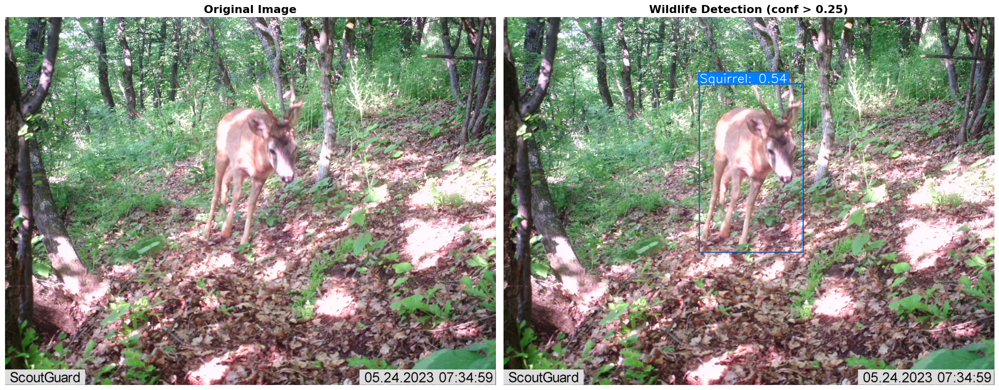


Image: 0011_28_05_IMAG0148.JPG
Detected 1 wildlife objects
--------------------------------------------------
  Object 1: Squirrel
    - Confidence: 0.54
    - Bounding Box: (1303,449) to (1990,1564)

Testing with confidence threshold: 0.25


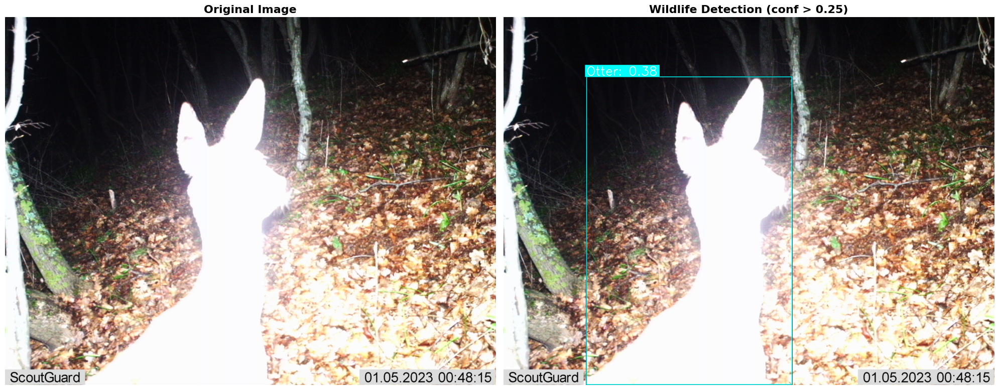


Image: 0866_x_IMAG0021.JPG
Detected 1 wildlife objects
--------------------------------------------------
  Object 1: Otter
    - Confidence: 0.38
    - Bounding Box: (552,400) to (1917,2444)

Testing with confidence threshold: 0.25


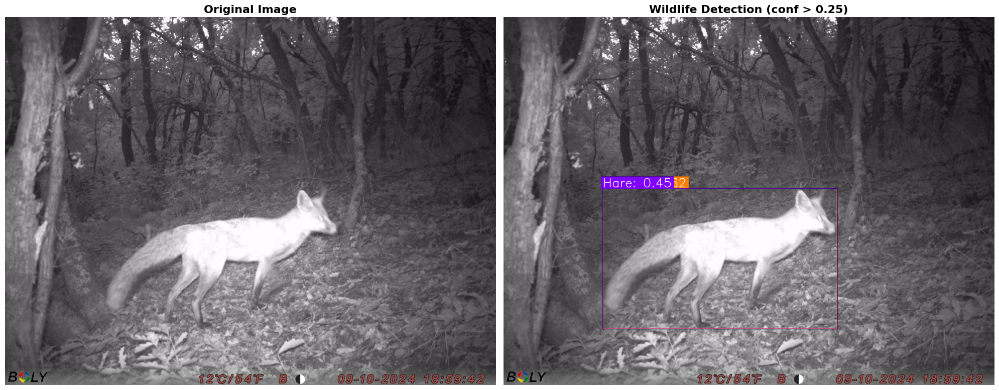


Image: 1535_3_11__mollowa_IMAG0115.JPG
Detected 2 wildlife objects
--------------------------------------------------
  Object 1: Wildcat
    - Confidence: 0.62
    - Bounding Box: (992,1714) to (3324,3110)
  Object 2: Hare
    - Confidence: 0.45
    - Bounding Box: (991,1715) to (3328,3112)

Testing with confidence threshold: 0.25


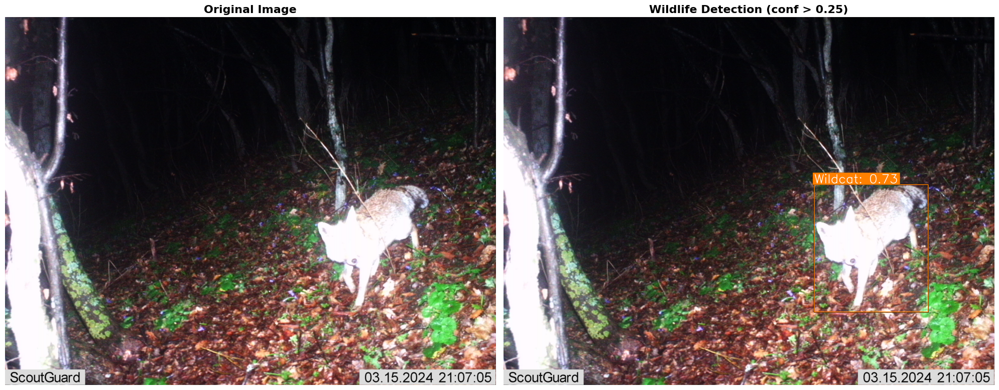


Image: 0420_12_4__2024_IMAG0006.JPG
Detected 1 wildlife objects
--------------------------------------------------
  Object 1: Wildcat
    - Confidence: 0.73
    - Bounding Box: (2066,1116) to (2823,1962)

Testing with confidence threshold: 0.25


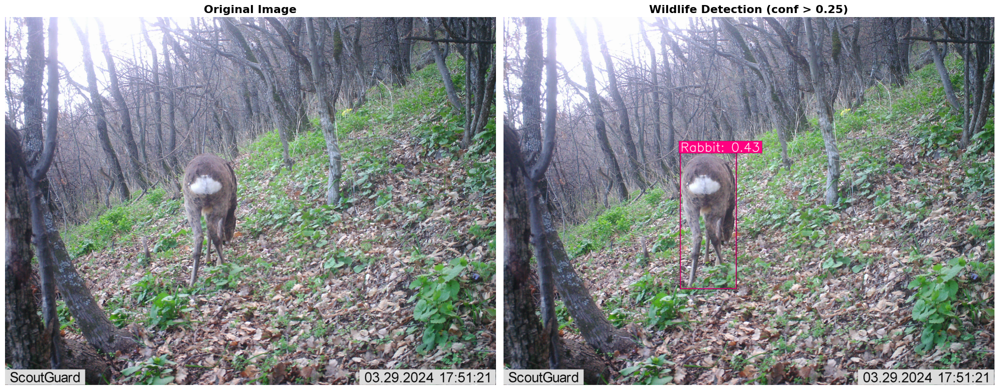


Image: 0342_12_4__2024_IMAG0096.JPG
Detected 1 wildlife objects
--------------------------------------------------
  Object 1: Rabbit
    - Confidence: 0.43
    - Bounding Box: (1176,906) to (1546,1807)


In [23]:
# Cell 7: Model sample testing on various images
# Add code for testing on various sample images
# Import necessary libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import random
import os

# Function to run inference on a wildlife image with clearly visible annotations
def test_wildlife_detector(model, image_path, conf_threshold=0.25):
    """
    Test the wildlife detector on a given image with well-balanced, readable annotations
    
    Args:
        model: Trained YOLO model
        image_path: Path to the image
        conf_threshold: Confidence threshold for detection
    
    Returns:
        Image with detection boxes
    """
    # Run detection with a lower confidence threshold for wildlife
    results = model.predict(image_path, conf=conf_threshold, verbose=False)[0]
    
    # Read the image
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Plot original and detected images side by side with larger figure size
    plt.figure(figsize=(20, 12))
    
    # Original image
    plt.subplot(1, 2, 1)
    plt.imshow(img_rgb)
    plt.title("Original Image", fontsize=16, fontweight='bold')
    plt.axis("off")
    
    # Image with detections
    plt.subplot(1, 2, 2)
    
    # Plot annotations
    boxes = results.boxes.xyxy.cpu().numpy()
    confs = results.boxes.conf.cpu().numpy()
    cls_ids = results.boxes.cls.cpu().numpy().astype(int)
    
    # Draw detections with good visibility but not excessive
    img_with_boxes = img_rgb.copy()
    
    # Create a vibrant color palette for different classes
    colors = [
        (255, 0, 0),     # Red
        (0, 255, 0),     # Green
        (0, 0, 255),     # Blue
        (255, 255, 0),   # Yellow
        (255, 0, 255),   # Magenta
        (0, 255, 255),   # Cyan
        (255, 128, 0),   # Orange
        (255, 0, 128),   # Pink
        (128, 0, 255),   # Purple
        (0, 128, 255)    # Light Blue
    ]
    
    for i, box in enumerate(boxes):
        x1, y1, x2, y2 = box.astype(int)
        conf = confs[i]
        cls_id = cls_ids[i]
        
        # Get class name and color
        if cls_id < len(class_names):
            cls_name = class_names[cls_id]
            color = colors[cls_id % len(colors)]
        else:
            cls_name = f"Unknown {cls_id}"
            color = colors[0]
        
        # Draw thick rectangle with good visibility
        border_thickness = 4  # Thick but not excessive
        
        # Draw a contrasting outline around the box for better visibility
        outline_color = (0, 0, 0)  # Black outline
        cv2.rectangle(img_with_boxes, 
                     (x1-1, y1-1), 
                     (x2+1, y2+1), 
                     outline_color, border_thickness+2)
        cv2.rectangle(img_with_boxes, 
                     (x1, y1), 
                     (x2, y2), 
                     color, border_thickness)
        
        # Create a clearly visible but not excessively large text label
        
        # Calculate good text size - moderate and appropriate
        img_height, img_width = img_with_boxes.shape[:2]
        label_size_factor = max(img_width, img_height) / 1800  # Slightly more aggressive scaling
        
        # Create a slightly larger, bolder label with confidence
        font_scale = max(1.5 * label_size_factor, 1.2)  # Slightly larger size, minimum 1.2
        thickness = max(int(2.5 * label_size_factor), 3)  # Slightly bolder, minimum 3
        
        # Initialize label text
        label = f"{cls_name}: {conf:.2f}"
        
        # Get text dimensions
        (text_width, text_height), baseline = cv2.getTextSize(
            label, cv2.FONT_HERSHEY_SIMPLEX, font_scale, thickness)
        
        # Calculate label box position with modest margins
        margin = int(6 * label_size_factor)  # Slightly larger margin
        rect_x1 = max(x1 - margin, 0)
        rect_y1 = max(y1 - text_height - 2*margin, 0)
        rect_x2 = min(rect_x1 + text_width + 2*margin, img_width)
        rect_y2 = min(y1, img_height)
        
        # Draw a well-sized background box for the text
        # First draw thin black outline for contrast
        cv2.rectangle(img_with_boxes, 
                    (rect_x1-1, rect_y1-1), 
                    (rect_x2+1, rect_y2+1), 
                    (0,0,0), -1)
        
        # Then draw colored background
        cv2.rectangle(img_with_boxes, 
                    (rect_x1, rect_y1), 
                    (rect_x2, rect_y2), 
                    color, -1)
        
        # Put slightly larger, bolder text with white color
        text_x = rect_x1 + margin
        text_y = rect_y2 - margin
        cv2.putText(img_with_boxes, label, 
                  (text_x, text_y), 
                  cv2.FONT_HERSHEY_SIMPLEX, 
                  font_scale, (255, 255, 255), thickness)
    
    plt.imshow(img_with_boxes)
    plt.title(f"Wildlife Detection (conf > {conf_threshold})", fontsize=16, fontweight='bold')
    plt.axis("off")
    
    plt.tight_layout()
    # Save high-quality image
    plt.savefig(os.path.join(reports_dir, f"sample_detection_{os.path.basename(image_path)}.png"), 
               dpi=300, bbox_inches='tight')
    plt.show()
    
    # Print detection details with enhanced formatting
    print(f"\nImage: {os.path.basename(image_path)}")
    print(f"{'='*50}")
    print(f"Detected {len(boxes)} wildlife objects")
    print(f"{'-'*50}")
    
    for i, box in enumerate(boxes):
        x1, y1, x2, y2 = box.astype(int)
        conf = confs[i]
        cls_id = cls_ids[i]
        cls_name = class_names[cls_id] if cls_id < len(class_names) else f"Unknown {cls_id}"
        box_width = x2 - x1
        box_height = y2 - y1
        
        print(f"  Object {i+1}: {cls_name}")
        print(f"    - Confidence: {conf:.2f}")
        print(f"    - Bounding Box: ({x1},{y1}) to ({x2},{y2})")
    
    if len(boxes) == 0:
        print("  No wildlife detected at this confidence threshold")
    
    print(f"{'='*50}")
    
    return img_with_boxes  # Return the image with boxes for potential saving

# Test on validation images with decreasing confidence thresholds
val_img_dir = os.path.join(yolo_dataset_path, 'images/val')
test_images = []

# Find images with annotations to test
for root, dirs, files in os.walk(val_img_dir):
    for file in files:
        if file.lower().endswith(('.jpg', '.jpeg', '.png')):
            base_name = os.path.splitext(file)[0]
            label_file = f"{base_name}.txt"
            label_path = os.path.join(yolo_dataset_path, 'labels/val', label_file)
            
            if os.path.exists(label_path):
                with open(label_path, 'r') as f:
                    if len(f.readlines()) > 0:  # File has annotations
                        test_images.append(os.path.join(root, file))
            
            if len(test_images) >= 5:  # Limit to 5 examples with annotations
                break
    if len(test_images) >= 5:
        break

# If we don't have 5 annotated images, use any images
if len(test_images) < 5:
    for root, dirs, files in os.walk(val_img_dir):
        for file in files:
            if file.lower().endswith(('.jpg', '.jpeg', '.png')):
                test_images.append(os.path.join(root, file))
                if len(test_images) >= 5:
                    break
        if len(test_images) >= 5:
            break

# Test the model
print(f"Testing model on {len(test_images)} sample images...")
for image_path in test_images:
    # Try with different confidence thresholds
    for conf in [0.25, 0.1, 0.05, 0.01]:
        print(f"\nTesting with confidence threshold: {conf}")
        result_img = test_wildlife_detector(model, image_path, conf_threshold=conf)
        
        # If detections were found, move to next image
        if len(model.predict(image_path, conf=conf, verbose=False)[0].boxes) > 0:
            break

In [24]:
# cell 12